In [1]:
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')

import os
import gsw
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yaml, os
import nc_time_axis, cftime
from datetime import datetime
import getpass
import xarray as xr
from mom6_tools.stats import extract_time_series, ocean_stats
from mom6_tools.m6toolbox import cime_xmlquery, genBasinMasks, weighted_temporal_mean_vars, add_global_attrs
from mom6_tools.MOM6grid import MOM6grid
from mom6_tools.poleward_heat_transport import  *
from dask.diagnostics import ProgressBar

ERROR 1: PROJ: proj_create_from_database: Open of /glade/work/pavelp/conda-envs/env-from-npl-2024a/share/proj failed


Basemap module not found. Some regional plots may not function properly


In [3]:
# Make the graphs a bit prettier, and bigger
#plt.style.use('seaborn-v0_8-whitegrid')
#pd.set_option('display.width', 5000)
#pd.set_option('display.max_columns', 60)
plt.rcParams['figure.figsize'] = (15, 5)
plt.rcParams.update({'font.size': 18})

In [4]:
class Experiment():
    def __init__(self, diag_config_yml_path = "no-GM.yaml", folder='ncfiles_coupled_55years'):
        # Read config file
        diag_config_yml = yaml.load(open(diag_config_yml_path,'r'), Loader=yaml.Loader)

        # Read paths
        self.folder = folder
        caseroot = diag_config_yml['Case']['CASEROOT']
        casename = cime_xmlquery(caseroot, 'CASE')
        DOUT_S = cime_xmlquery(caseroot, 'DOUT_S')
        rundir = cime_xmlquery(caseroot, 'RUNDIR')
        
        if DOUT_S:
          OUTDIR = cime_xmlquery(caseroot, 'DOUT_S_ROOT')+'/ocn/hist/'
        else:
          OUTDIR = cime_xmlquery(caseroot, 'RUNDIR')
        
        print('Rundir directory is:', rundir)
        print('Casename is:', casename)
    
        # Organize paths as a classcreate an empty class object
        class args:
          pass
        
        args.rundir = rundir
        args.casename = casename
        args.caseroot = caseroot
        args.OUTDIR = OUTDIR
        args.ICEDIR = cime_xmlquery(caseroot, 'DOUT_S_ROOT') + '/ice/hist'
        args.ATMDIR = cime_xmlquery(caseroot, 'DOUT_S_ROOT') + '/atm/hist'
        args.nw = 1
        args.savefigs = False
        args.static = casename+diag_config_yml['Fnames']['static']
        args.native = casename+diag_config_yml['Fnames']['native']
        args.ice = casename+diag_config_yml['Fnames']['ice']
        args.geom =   casename+diag_config_yml['Fnames']['geom']
        avg = diag_config_yml['Avg']
        args.start_date = avg['start_date']
        args.end_date = avg['end_date']
        
        # Save paths as a class field
        self.args = args

        try:
          # read grid info
          geom_file = OUTDIR+'/'+args.geom
          if os.path.exists(geom_file):
            grd = MOM6grid(OUTDIR+'/'+args.static, geom_file, xrformat=True)
          else:
            grd = MOM6grid(OUTDIR+'/'+args.static, xrformat=True)
          
          try:
            depth = grd.depth_ocean.values
          except:
            depth = grd.deptho.values
          
          try:
            area = grd.area_t.where(grd.wet > 0)
          except:
            area = grd.areacello.where(grd.wet > 0)

          # basin masks - remove Nan's, otherwise genBasinMasks won't work
          depth[np.isnan(depth)] = 0.0
          basin_code = genBasinMasks(grd.geolon.values, grd.geolat.values, depth, verbose=False)
          basin_code_xr = genBasinMasks(grd.geolon.values, grd.geolat.values, depth, verbose=False, xda=True)

          self.grd = grd
          self.depth = depth
          self.area = area
          self.basin_code = basin_code
          self.basin_code_xr = basin_code_xr
        except:
          pass

    def compute_and_average_heat_fluxes(self):
        print('Reading dataset...')
        ds = xr.open_mfdataset(self.args.OUTDIR+'/'+self.args.native, \
         parallel=True, data_vars='minimal', chunks={'time': 12},\
         coords='minimal', compat='override')[['T_ady_2d', 'T_diffy_2d', 'T_hbd_diffy_2d']]
        print('Dataset is initialized.')

        print('\n Selecting and loading data between {} and {}...'.format(self.args.start_date, self.args.end_date))
        ds_sel = ds.sel(time=slice(self.args.start_date, self.args.end_date)).load()

        attrs =  {
         'description': 'Annual mean of poleward heat transport by components ',
         'start_date': self.args.start_date,
         'end_date': self.args.end_date,
         'reduction_method': 'annual mean weighted by days in each month',
         'casename': self.args.casename
         }

        print('Computing annual mean...')
        ds_ann =  weighted_temporal_mean_vars(ds_sel,attrs=attrs)

        print('Computing time-average over all selected data...')
        ds_mean = ds_ann.mean('time').load()

        print('Saving heat fluxes to file...')
        attrs = {'description': 'Time-mean poleward heat transport by components ', 'units': ds['T_ady_2d'].units,
                 'start_date': self.args.start_date, 'end_date': self.args.end_date, 'casename': self.args.casename}
        add_global_attrs(ds_mean,attrs)
        ds_mean.to_netcdf(f'{self.folder}/{self.args.casename}_heat_transport.nc')

    def compute_ice(self):
      print('Reading dataset...')
      ds = xr.open_mfdataset(self.args.ICEDIR+'/'+self.args.ice, \
        parallel=True, data_vars='minimal', \
        coords='minimal', compat='override', preprocess=lambda ds: ds[['hi', 'aice']])
      
      ice_volume = ds.hi.rename({'nj': 'yh', 'ni': 'xh'}) * self.area
      ice_thickness = ds.hi.rename({'nj': 'yh', 'ni': 'xh'})
      ice_extent = ds.aice.rename({'nj': 'yh', 'ni': 'xh'})
      yh = ice_volume.yh

      dataset = xr.Dataset()
      with ProgressBar():
        dataset['ice_volume_NH']= (ice_volume).where(yh>0).sum(['xh', 'yh']).compute()
        dataset['ice_volume_SH'] = (ice_volume).where(yh<0).sum(['xh', 'yh']).compute()
        dataset['ice_thickness'] = ice_thickness.sel(time=slice('0031','0054')).mean('time').compute()
        dataset['ice_extent'] = ice_extent.sel(time=slice('0031','0054')).mean('time').compute()
          
      dataset.to_netcdf(f'{self.folder}/{self.args.casename}_ice_volume.nc')

    def compute_atm(self):
      files = [f'{self.args.ATMDIR}/{self.args.casename}.cam.h0a.00{year}-{month:02d}.nc' for year in range(31,55) for month in range(1,13)]
      ds = xr.open_mfdataset(files, combine='by_coords')

      dataset = xr.Dataset()
      
      dataset['TS_mean'] = ds.TS.mean('time').compute()
      dataset['T_mean'] = ds.T.mean('lon').compute().mean('time')
      dataset['U_mean'] = ds.U.mean('lon').compute().mean('time')

      with ProgressBar():
          dataset.to_netcdf(f'{self.folder}/{self.args.casename}_atm_time_mean.nc')

    def compute_hfds_time_mean(self):
      ds = xr.open_mfdataset(self.args.OUTDIR+'/'+self.args.native,
        parallel=True, data_vars='minimal',
        coords='minimal', compat='override', preprocess=lambda ds: ds[['hfds']])
      
      ds = ds.sel(time=slice(self.args.start_date, self.args.end_date))

      with ProgressBar():
        ds_mean = ds.mean('time').compute()
      
      ds_mean.to_netcdf(self.folder+'/'+self.args.casename+'_hfds_time_mean.nc')
    
    def hfds_time_mean(self):
      return xr.open_dataset(self.folder+'/'+self.args.casename+'_hfds_time_mean.nc')['hfds']
    
    def atm_mean(self):
      return xr.open_dataset(f'{self.folder}/{self.args.casename}_atm_time_mean.nc')

    def heat_transport(self):
      ds = xr.open_dataset(self.folder+'/'+self.args.casename+'_heat_transport.nc').fillna(0.)
      return ds['T_ady_2d'] + ds['T_diffy_2d'] + ds['T_hbd_diffy_2d']
  
    def thetao(self):
      ds = xr.open_dataset(f'{self.folder}/{self.args.casename}_thetao_time_mean.nc')
      return ds
  
    def so(self):
      ds = xr.open_dataset(f'{self.folder}/{self.args.casename}_so_time_mean.nc')
      return ds
  
    def ice_volume(self):
       return xr.open_dataset(f'{self.folder}/{self.args.casename}_ice_volume.nc')

    def sigma2(self):
      thetao = self.thetao().thetao
      so = self.so().so
      return gsw.sigma2(so, thetao)

    def mld_winter(self):
      ds = xr.open_dataset(f'{self.folder}/{self.args.casename}_MLD_winter.nc')
      return ds

    def mld_summer(self):
      ds = xr.open_dataset(f'{self.folder}/{self.args.casename}_MLD_summer.nc')
      return ds

In [5]:
exps = {}
for exp in ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']:
#for exp in ['coupled_bANN_0.6']:
    exps[exp] = Experiment(f'{exp}.yaml')

Rundir directory is: /glade/derecho/scratch/jiarongw/CTRL/run
Casename is: CTRL


MOM6 grid successfully loaded... 

Rundir directory is: /glade/derecho/scratch/pavelp/coupled_bANN_0.3/run
Casename is: coupled_bANN_0.3
MOM6 grid successfully loaded... 

Rundir directory is: /glade/derecho/scratch/pavelp/coupled_bANN_0.6/run
Casename is: coupled_bANN_0.6
MOM6 grid successfully loaded... 

Rundir directory is: /glade/derecho/scratch/pavelp/coupled_bANN_1.0/run
Casename is: coupled_bANN_1.0
MOM6 grid successfully loaded... 

Rundir directory is: /glade/derecho/scratch/pavelp/coupled_bANN_1.0_uANN_1.0/run
Casename is: coupled_bANN_1.0_uANN_1.0


# Temperature timeseries

In [8]:
dd = {}
for exp in ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']:
    dd[exp] = xr.open_dataset(f'ncfiles_coupled_55years/{exp}_mon_ave_global_means.nc').load()

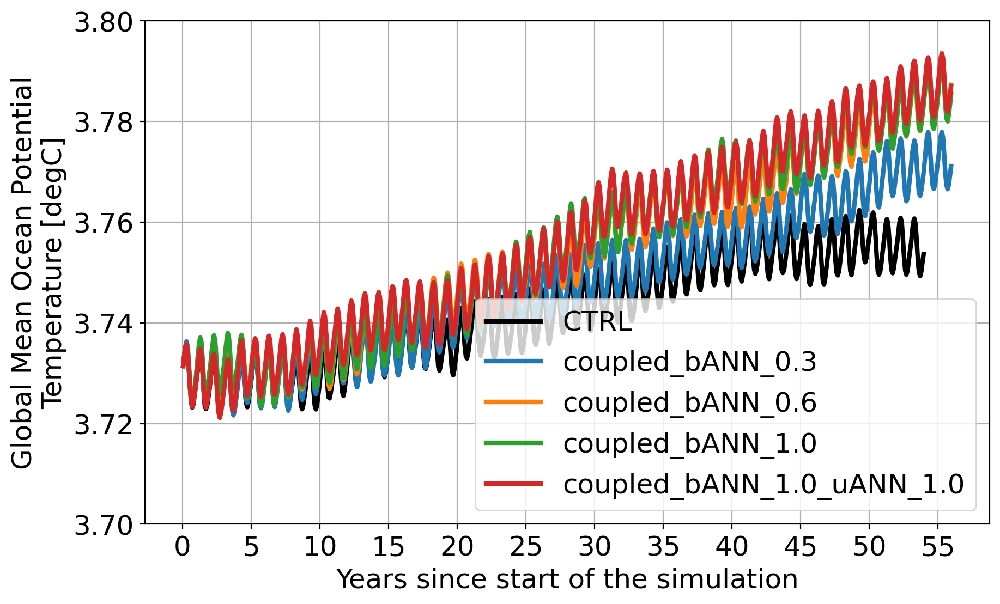

In [8]:
%matplotlib inline

fig, ax = plt.subplots(dpi=200, figsize=(10,6))
for exp in ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']:
    dd[exp].thetaoga.plot(ax=ax, label=exp, lw=3, color='k' if exp=='CTRL' else None)
    ax.set_title('')
    #plt.legend()
plt.xlabel('Years since start of the simulation')

time = dd[exp].thetaoga.time.values

# Build vertical lines every 5 years
years = range(time[0].year, time[-1].year + 2, 5)
ticks = [cftime.DatetimeNoLeap(y, 1, 1) for y in years]

plt.xticks(ticks, np.arange(0,60,5))
plt.grid()

plt.ylim([3.7,3.8])
plt.legend(loc='lower right')

plt.savefig('PNG_coupled_55years/T_timeseries.png',dpi=200, bbox_inches='tight')

# Ice Volume

In [5]:
from dask.diagnostics import ProgressBar
#for exp in ['coupled_bANN_0.3', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']:
for exp in ['coupled_bANN_0.6']:
    exps[exp].compute_ice()

Reading dataset...
[########################################] | 100% Completed | 61.73 s
[########################################] | 100% Completed | 19.75 s
[########################################] | 100% Completed | 1.67 sms
[########################################] | 100% Completed | 20.11 s


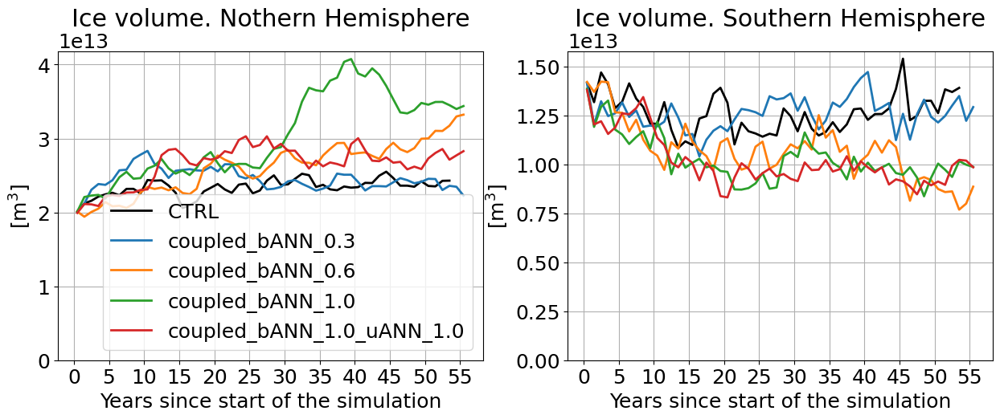

In [11]:
%matplotlib inline


plt.subplot(1,2,1)
for exp in ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']:
    exps[exp].ice_volume().ice_volume_NH.coarsen(time=12).mean().plot(label=exp, lw=2, color='k' if exp=='CTRL' else None)
    plt.legend()
plt.xlabel('Years since start of the simulation')
plt.title('Ice volume. Nothern Hemisphere')

time = dd[exp].thetaoga.time.values

# Build vertical lines every 5 years
years = range(time[0].year, time[-1].year + 2, 5)
ticks = [cftime.DatetimeNoLeap(y, 1, 1) for y in years]
plt.ylabel('[m$^3$]')

plt.xticks(ticks, np.arange(0,60,5))
plt.grid()
plt.ylim([0,None])

plt.subplot(1,2,2)
for exp in ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']:
    exps[exp].ice_volume().ice_volume_SH.coarsen(time=12).mean().plot(label=exp, lw=2, color='k' if exp=='CTRL' else None)
    #plt.legend()
plt.xlabel('Years since start of the simulation')
plt.title('Ice volume. Southern Hemisphere')

time = dd[exp].thetaoga.time.values

# Build vertical lines every 5 years
years = range(time[0].year, time[-1].year + 2, 5)
ticks = [cftime.DatetimeNoLeap(y, 1, 1) for y in years]
plt.ylabel('[m$^3$]')

plt.xticks(ticks, np.arange(0,60,5))
plt.grid()
plt.ylim([0,None])

plt.savefig('PNG_coupled_55years/ice_volume.png',dpi=200, bbox_inches='tight')

# Plot heat transport

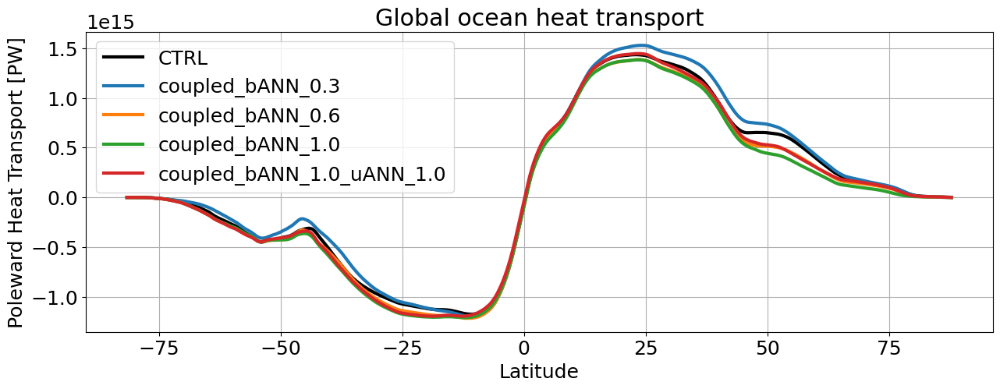

In [15]:
for exp in ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']:
    experiment = exps[exp]
    transport = experiment.heat_transport()

    transport.sum('xh').plot(label=exp, lw=3, color='k' if exp=='CTRL' else None)
plt.legend()
plt.xlabel('Latitude')
plt.ylabel('Poleward Heat Transport [PW]')
plt.grid()
plt.title('Global ocean heat transport')
plt.savefig('PNG_coupled_55years/heat_transport.png')

In [16]:
basin_code_xr = exps['CTRL'].basin_code_xr
atl = (basin_code_xr.sel(region='MedSea') + basin_code_xr.sel(region='HudsonBay') +     \
      basin_code_xr.sel(region='Arctic') + basin_code_xr.sel(region='AtlanticOcean') + \
      basin_code_xr.sel(region='BlackSea'))
atl['region'] = 'Altantic mask'

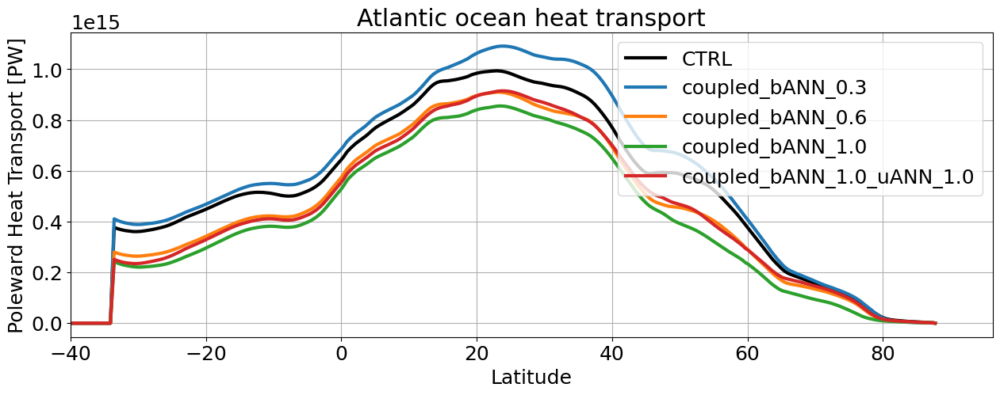

In [17]:
for exp in ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']:
    experiment = exps[exp]
    transport = experiment.heat_transport() * atl.values

    transport.sum('xh').plot(label=exp, lw=3, color='k' if exp=='CTRL' else None)
plt.legend()
plt.xlabel('Latitude')
plt.ylabel('Poleward Heat Transport [PW]')
plt.xlim([-40,None])
plt.grid()
plt.title('Atlantic ocean heat transport')
plt.savefig('PNG_coupled_55years/heat_transport_Atlantic.png')

# Air-sea flux

In [18]:
from dask.diagnostics import ProgressBar
#for exp in ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']:
for exp in ['coupled_bANN_0.6']:
    exps[exp].compute_hfds_time_mean()

[########################################] | 100% Completed | 29.97 s


In [19]:
jra = xr.open_dataset('/glade/work/gmarques/cesm/datasets/Heat_transport/jra55fcst_v1_3_annual_1x1/nht_jra55do_v1_3.nc')

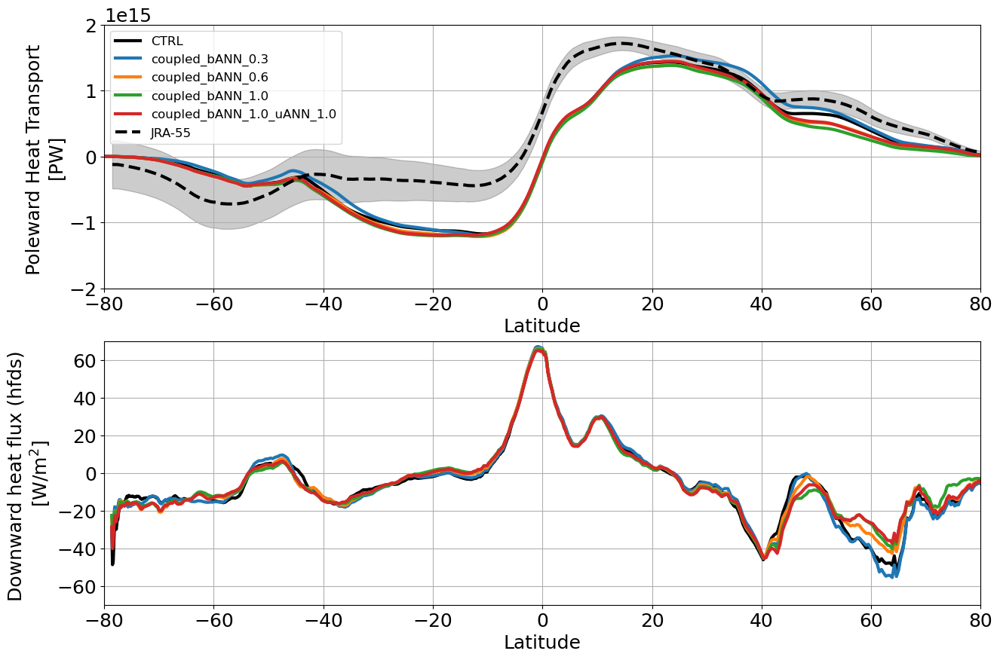

In [23]:
%matplotlib inline

plt.figure(figsize=(15,10))
plt.subplot(2,1,1)
for exp, label in zip(['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0'], ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']):
#for exp, label in zip(['coupled_bANN_0.3', 'coupled_bANN_1.0'], ['coupled_bANN_0.3', 'coupled_bANN_1.0']):
    transport = exps[exp].heat_transport()
    transport.sum('xh').plot(label=label, lw=3, color='k' if exp=='CTRL' else None)

jra_mean = jra.nht.mean('time').isel(basin=0) * 1e+15
jra_std = jra.nht.std('time').isel(basin=0) * 1e+15
jra_mean.plot(label='JRA-55', lw=3, color='k', ls='--')
plt.fill_between(jra_mean.lat, jra_mean-jra_std, jra_mean+jra_std, color='k', alpha=0.2)
plt.title('')

plt.legend(fontsize=12)
plt.xlabel('Latitude')
plt.ylabel('Poleward Heat Transport \n[PW]')
plt.grid()
plt.ylim([-2.0e+15, 2.0e+15])
plt.xlim([-80,80])

plt.subplot(2,1,2)
for exp, label in zip(['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0'], ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']):
#for exp, label in zip(['coupled_bANN_0.3', 'coupled_bANN_1.0'], ['coupled_bANN_0.3', 'coupled_bANN_1.0']):
    hfds_zonal_ave = zonal_ave(exps[exp].hfds_time_mean(), exps['CTRL'].grd.geolat)

    hfds_zonal_ave.plot(label=label, lw=3, color='k' if exp=='CTRL' else None)
plt.grid()
#plt.legend()
plt.xlabel('Latitude')
plt.ylabel('Downward heat flux (hfds) \n[W/m$^2$]')

plt.xlim([-80,80])
plt.ylim([-70, 70])

plt.savefig('PNG_coupled_55years/heat_transport_surface_flux.png', bbox_inches='tight', dpi=200)
plt.show()

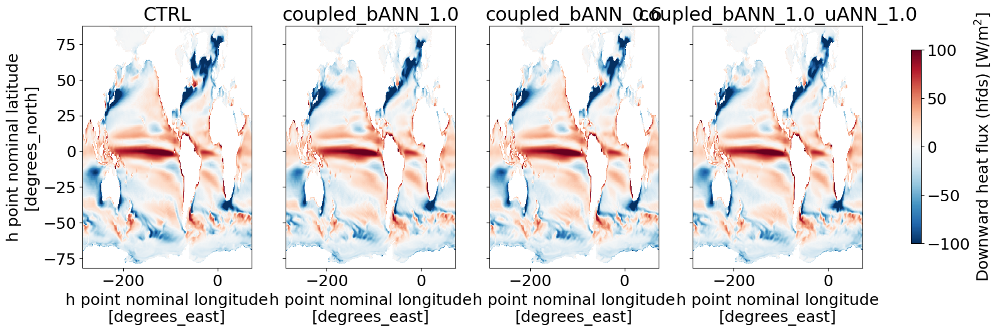

In [25]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharex=True, sharey=True)

cases = ['CTRL', 'coupled_bANN_1.0', 'coupled_bANN_0.6', 'coupled_bANN_1.0_uANN_1.0']
ims = []
for ax, exp in zip(axes, cases):
    im = exps[exp].hfds_time_mean().plot(ax=ax, vmin=-100, add_colorbar=False)
    ax.set_title(exp)
    ims.append(im)

# Keep the y-label only on the first (leftmost) panel
for ax in axes[1:]:
    ax.set_ylabel('')

fig.colorbar(ims[0], ax=axes, orientation='vertical', shrink=0.8,
             label='Downward heat flux (hfds) [W/m$^2$]')
plt.show()


# Ice thickness and extent

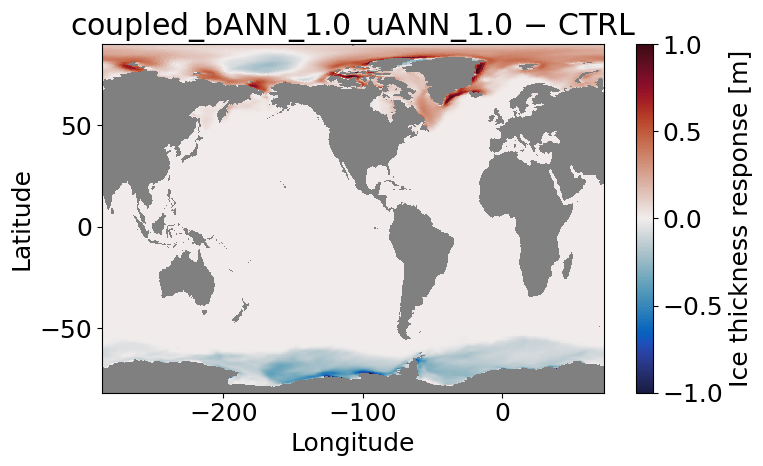

In [31]:
import cmocean
plt.figure(figsize=(8,5))
exp = 'coupled_bANN_1.0_uANN_1.0'
data = exps[exp].ice_volume().ice_thickness - exps['CTRL'].ice_volume().ice_thickness
im =plt.pcolormesh(exps['CTRL'].grd.geolon, exps['CTRL'].grd.geolat, data, vmin=-1, vmax=1, cmap=cmocean.cm.balance)
plt.colorbar(im, label='Ice thickness response [m]')
plt.title(f'{exp} $-$ CTRL')
plt.gca().set_facecolor('gray')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.tight_layout()
plt.savefig(f'PNG_coupled_55years/ice_thickness_response_{exp}.png', dpi=200, bbox_inches='tight')

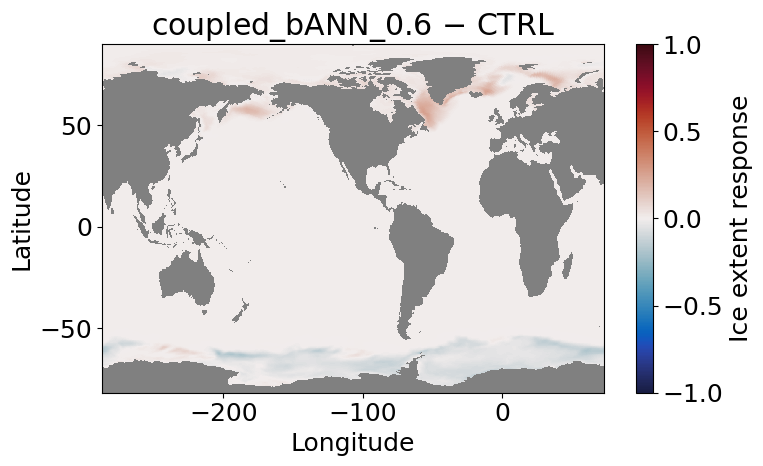

In [36]:
import cmocean
plt.figure(figsize=(8,5))
exp = 'coupled_bANN_0.6'
data = exps[exp].ice_volume().ice_extent - exps['CTRL'].ice_volume().ice_extent
im =plt.pcolormesh(exps['CTRL'].grd.geolon, exps['CTRL'].grd.geolat, data, vmin=-1, vmax=1, cmap=cmocean.cm.balance)
plt.colorbar(im, label='Ice extent response')
plt.title(f'{exp} $-$ CTRL')
plt.gca().set_facecolor('gray')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.tight_layout()
plt.savefig(f'PNG_coupled_55years/ice_extent_response_{exp}.png', dpi=200, bbox_inches='tight')

# MOC

In [121]:
import intake
catalog = intake.open_catalog('/glade/u/home/gmarques/libs/oce-catalogs/reference-datasets.yml')
rapid = catalog['moc-rapid'].to_dask()

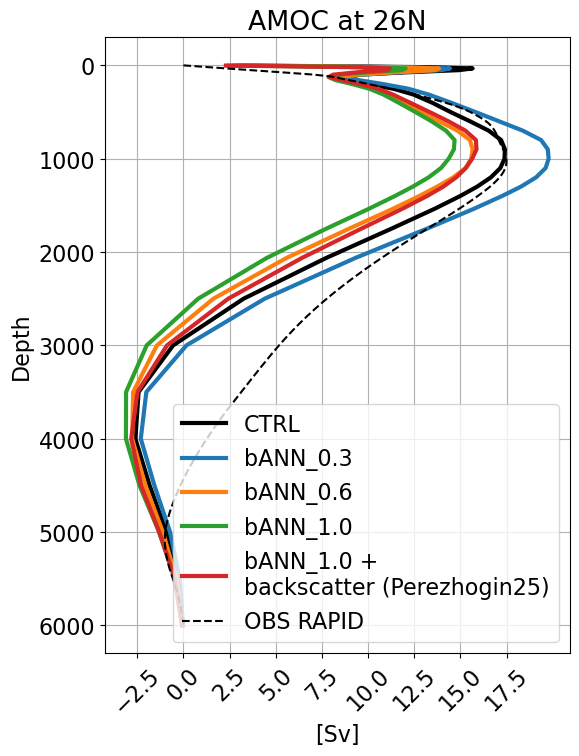

In [122]:
plt.rcParams.update({'font.size': 16})
plt.figure(figsize=(6,8))
for exp, label in zip(['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0'],
                      ['CTRL', 'bANN_0.3', 'bANN_0.6', 'bANN_1.0', 'bANN_1.0 + \nbackscatter (Perezhogin25)']):
    xr.open_dataset(f'ncfiles_coupled_55years/{exp}_MOC.nc').amoc.sel(yq=26,method='nearest').plot(label=label, y='zl', lw=3, color='k' if exp=='CTRL' else None)
rapid.stream_function_mar.mean('time').plot(color='k', label='OBS RAPID', y='depth', ls='--')
plt.gca().invert_yaxis()
plt.xticks(np.arange(-2.5,20,2.5), rotation=45)
plt.grid()
plt.legend()
plt.title('AMOC at 26N')
plt.ylabel('Depth')
plt.xlabel('[Sv]')

plt.savefig('PNG_coupled_55years/AMOC_RAPID_backscatter.png', dpi=200, bbox_inches='tight')

# Drake Transport

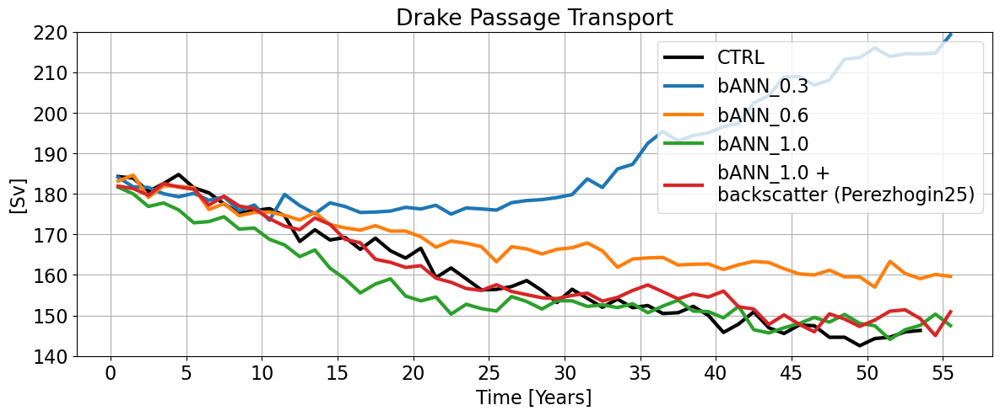

In [40]:
plt.rcParams.update({'font.size': 16})
plt.figure(figsize=(14,5))
for exp, label in zip(['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0'],
                      ['CTRL', 'bANN_0.3', 'bANN_0.6', 'bANN_1.0', 'bANN_1.0 + \nbackscatter (Perezhogin25)']):
    data = xr.open_dataset(f'ncfiles_coupled_55years/{exp}_section_transports.nc').transport.isel(sections=5).coarsen({'time':12}).mean()
    data.plot(label=label, lw=3, color='k' if exp=='CTRL' else None)
plt.grid()
plt.legend()
plt.title('Drake Passage Transport')
plt.xlabel('Time [Years]')
plt.ylabel('[Sv]')
plt.ylim([140,220])

# Build vertical lines every 5 years
time = data.time.values
years = range(time[0].year, time[-1].year + 2, 5)
ticks = [cftime.DatetimeNoLeap(y, 1, 1) for y in years]
plt.xticks(ticks, np.arange(0,60,5))

plt.savefig('PNG_coupled_55years/Drake.png', dpi=200)

In [115]:
def zonal_ave(array, geolat):
    """Bin 2D array into 1-degree latitude bands using geolat (works on tripolar grids)."""
    # Define edges between grid cells as bin edges, discarding a couple of boundary points
    if geolat is not None:
        bins = array.yh.values
        bins = (bins[0:-1] + bins[1:]) / 2
        return array.groupby_bins(geolat, bins=bins).mean()
    else:
        return array.mean('xh')

# Temperature response

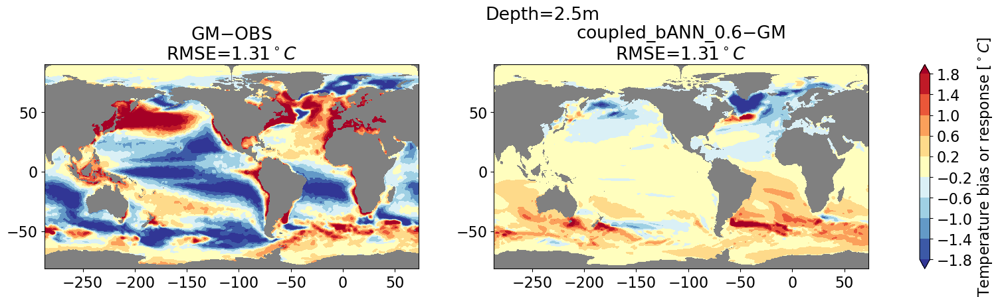

In [43]:
from mom6_tools.m6plot import myStats
%matplotlib inline
plt.figure(figsize=(20,4))
area = np.ma.masked_invalid(exps['CTRL'].area) # All computations including area will be masked array from now on
zl = 0
exp='coupled_bANN_0.6'
bias = exps['CTRL'].thetao().thetao_bias[zl]
response = (exps[exp].thetao().thetao - exps['CTRL'].thetao().thetao)[zl]
geolon = exps['CTRL'].grd.geolon
geolat = exps['CTRL'].grd.geolat
cmap = plt.cm.RdYlBu_r.copy()
vmin,vmax,ci = -1.8,1.8,0.4
cilev = np.arange(vmin,vmax+ci,ci)
plt.subplot(1,2,1)
plt.contourf(geolon, geolat, bias, cmap=cmap, levels=cilev, extend='both')
_, _, _, _, error = myStats(np.ma.masked_invalid(bias), area)
plt.title(f'GM$-$OBS\nRMSE={error:.2f}$^\circ C$')
plt.gca().set_facecolor('gray')
plt.subplot(1,2,2)
im = plt.contourf(geolon, geolat, response, cmap=cmap, levels=cilev, extend='both')
_, _, _, _, error = myStats(np.ma.masked_invalid(exps[exp].thetao().thetao_bias[zl]), area)
plt.title(f'{exp}$-$GM\nRMSE={error:.2f}$^\circ C$')
plt.gca().set_facecolor('gray')
plt.colorbar(im,ax=plt.gcf().axes, label='Temperature bias or response [$^\circ C]$', extend='both')
depth = round(float(bias.z_l), 1)
plt.suptitle(f'Depth={depth}m', y=1.1)
plt.savefig(f'PNG_coupled_55years/response_{zl}z_{exp}.png',dpi=200, bbox_inches='tight')

# Zonal average

In [73]:
import intake
catalog = intake.open_catalog('/glade/u/home/gmarques/libs/oce-catalogs/reference-datasets.yml')
ctrl = exps['CTRL'].thetao().thetao
thetao_obs = catalog['woa-2018-tx2_3v2-annual-all'].to_dask().thetao.values + xr.zeros_like(ctrl)
so_obs = catalog['woa-2018-tx2_3v2-annual-all'].to_dask().so.values + xr.zeros_like(ctrl)

In [74]:
mask = xr.where(np.isnan(thetao_obs) | np.isnan(ctrl), np.nan, 1)

# Aggregaed diagnostics first

In [97]:
for exp in ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']:
    thetao = exps[exp].thetao().thetao
    error = (thetao - thetao_obs) * mask
    rmse_thetao = float(np.sqrt((error**2).mean()))

    so = exps[exp].so().so
    error = (so - so_obs) * mask
    rmse_so = float(np.sqrt((error**2).mean()))

    sigma2 = exps[exp].sigma2()
    error = (sigma2 - gsw.sigma2(so_obs, thetao_obs)) * mask
    rmse_sigma2 = float(np.sqrt((error**2).mean()))

    print(f'{exp}: RMSE_thetao={rmse_thetao}, RMSE_so={rmse_so}, RMSE_sigma2={rmse_sigma2}')

CTRL: RMSE_thetao=1.128192628115981, RMSE_so=0.4205291102785956, RMSE_sigma2=0.3688672413020296
coupled_bANN_0.3: RMSE_thetao=1.2363203500250055, RMSE_so=0.40945110396049134, RMSE_sigma2=0.36889750473672894
coupled_bANN_0.6: RMSE_thetao=1.1703592781772296, RMSE_so=0.41002449969819754, RMSE_sigma2=0.35840343044911716
coupled_bANN_1.0: RMSE_thetao=1.1823032746692455, RMSE_so=0.40783810520170116, RMSE_sigma2=0.34894230005915744
coupled_bANN_1.0_uANN_1.0: RMSE_thetao=1.1375187219818848, RMSE_so=0.40769263872732314, RMSE_sigma2=0.34884740333672637


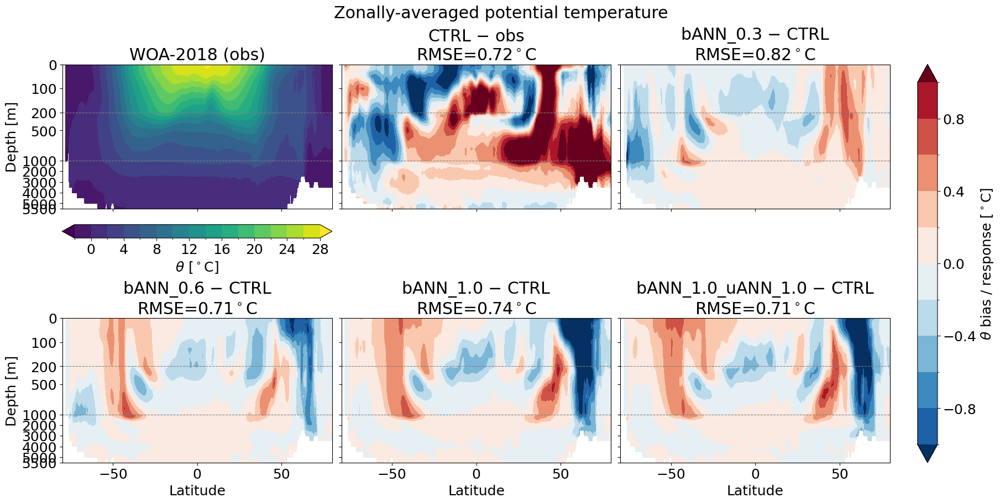

In [92]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})

geolat = exps['CTRL'].grd.geolat
experiments = ['coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']
labels = {'coupled_bANN_0.3': 'bANN_0.3', 'coupled_bANN_0.6': 'bANN_0.6',
          'coupled_bANN_1.0': 'bANN_1.0', 'coupled_bANN_1.0_uANN_1.0': 'bANN_1.0_uANN_1.0'}

# Piecewise-linear depth axis: 0-200, 200-1000, 1000-5500 m each get 1/3 of the height
d_edges = [0, 200, 1000, 5500]

def _depth_forward(d):
    d = np.asarray(d, dtype=float)
    return np.where(d <= d_edges[1], (d - d_edges[0]) / (d_edges[1] - d_edges[0]) / 3,
           np.where(d <= d_edges[2], 1 / 3 + (d - d_edges[1]) / (d_edges[2] - d_edges[1]) / 3,
                    2 / 3 + (d - d_edges[2]) / (d_edges[3] - d_edges[2]) / 3))

def _depth_inverse(y):
    y = np.asarray(y, dtype=float)
    return np.where(y <= 1 / 3, d_edges[0] + y * 3 * (d_edges[1] - d_edges[0]),
           np.where(y <= 2 / 3, d_edges[1] + (y - 1 / 3) * 3 * (d_edges[2] - d_edges[1]),
                    d_edges[2] + (y - 2 / 3) * 3 * (d_edges[3] - d_edges[2])))

# --- Zonally-averaged potential temperature ---
obs = thetao_obs
ctrl_field = exps['CTRL'].thetao().thetao

obs_levels = np.arange(-2, 30, 2)
diff_levels = np.arange(-1, 1.01, 0.2)

fig, axes = plt.subplots(2, 3, figsize=(18, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# Panel 1: observations
im_obs = zonal_ave(obs * mask, geolat).plot.contourf(
    ax=axes[0], levels=obs_levels, cmap='viridis', extend='both', add_colorbar=False)
axes[0].set_title('WOA-2018 (obs)')
fig.colorbar(im_obs, ax=axes[0], location='bottom', label='$\\theta$ [$^\\circ$C]', extend='both')

# Panel 2: CTRL bias (CTRL - obs)
bias_za = zonal_ave((ctrl_field - obs) * mask, geolat)
rmse = float(np.sqrt((bias_za ** 2).mean()))
im_diff = bias_za.plot.contourf(
    ax=axes[1], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
axes[1].set_title(f'CTRL $-$ obs\nRMSE={rmse:.2f}$^\\circ$C')

# Panels 3-6: response (exp - CTRL), RMSE computed vs obs
for k, exp in enumerate(experiments):
    field = exps[exp].thetao().thetao
    resp_za = zonal_ave((field - ctrl_field) * mask, geolat)
    rmse = float(np.sqrt((zonal_ave((field - obs) * mask, geolat) ** 2).mean()))
    im_diff = resp_za.plot.contourf(
        ax=axes[k + 2], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
    axes[k + 2].set_title(f'{labels[exp]} $-$ CTRL\nRMSE={rmse:.2f}$^\\circ$C')

fig.colorbar(im_diff, ax=[axes[1], axes[2], axes[4], axes[5]],
             label='$\\theta$ bias / response [$^\\circ$C]', extend='both')

for ax in axes:
    ax.set_xlim([-80, 80])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_yscale('function', functions=(_depth_forward, _depth_inverse))
    ax.set_ylim(d_edges[3], d_edges[0])
    ax.set_yticks([0, 100, 200, 500, 1000, 2000, 3000, 4000, 5000, 5500])
    for d in (d_edges[1], d_edges[2]):
        ax.axhline(d, color='0.5', lw=0.8, ls='--')
for ax in axes[3:]:
    ax.set_xlabel('Latitude')
for ax in (axes[0], axes[3]):
    ax.set_ylabel('Depth [m]')

fig.suptitle('Zonally-averaged potential temperature')
plt.savefig('PNG_coupled_55years/thetao_zonal_ave_bias_response.png', dpi=200, bbox_inches='tight')
plt.show()


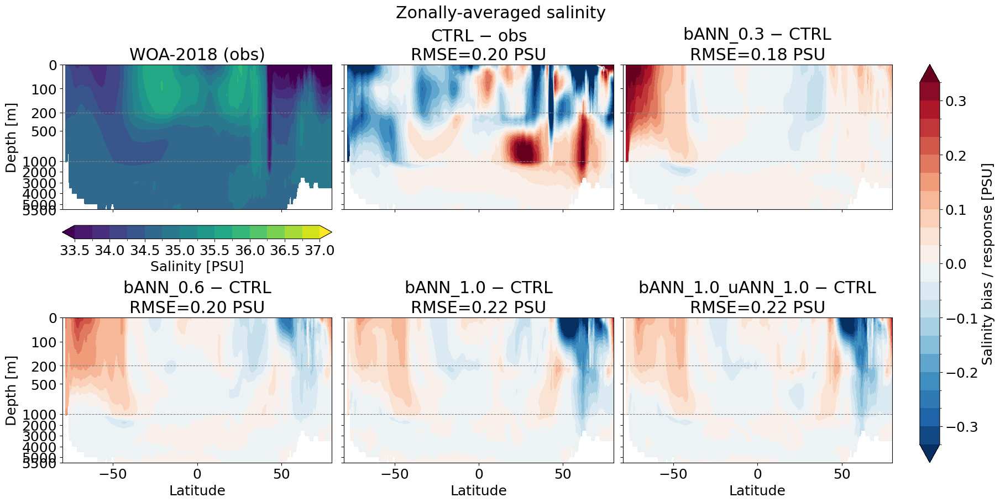

In [93]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})

geolat = exps['CTRL'].grd.geolat

# Piecewise-linear depth axis: 0-200, 200-1000, 1000-5500 m each get 1/3 of the height
d_edges = [0, 200, 1000, 5500]

def _depth_forward(d):
    d = np.asarray(d, dtype=float)
    return np.where(d <= d_edges[1], (d - d_edges[0]) / (d_edges[1] - d_edges[0]) / 3,
           np.where(d <= d_edges[2], 1 / 3 + (d - d_edges[1]) / (d_edges[2] - d_edges[1]) / 3,
                    2 / 3 + (d - d_edges[2]) / (d_edges[3] - d_edges[2]) / 3))

def _depth_inverse(y):
    y = np.asarray(y, dtype=float)
    return np.where(y <= 1 / 3, d_edges[0] + y * 3 * (d_edges[1] - d_edges[0]),
           np.where(y <= 2 / 3, d_edges[1] + (y - 1 / 3) * 3 * (d_edges[2] - d_edges[1]),
                    d_edges[2] + (y - 2 / 3) * 3 * (d_edges[3] - d_edges[2])))

# --- Zonally-averaged salinity ---
obs = so_obs
ctrl_field = exps['CTRL'].so().so

obs_levels = np.arange(33.5, 37.01, 0.25)
diff_levels = np.arange(-1, 1.01, 0.1) / 3

fig, axes = plt.subplots(2, 3, figsize=(18, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# Panel 1: observations
im_obs = zonal_ave(obs * mask, geolat).plot.contourf(
    ax=axes[0], levels=obs_levels, cmap='viridis', extend='both', add_colorbar=False)
axes[0].set_title('WOA-2018 (obs)')
fig.colorbar(im_obs, ax=axes[0], location='bottom', label='Salinity [PSU]', extend='both')

# Panel 2: CTRL bias (CTRL - obs)
bias_za = zonal_ave((ctrl_field - obs) * mask, geolat)
rmse = float(np.sqrt((bias_za ** 2).mean()))
im_diff = bias_za.plot.contourf(
    ax=axes[1], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
axes[1].set_title(f'CTRL $-$ obs\nRMSE={rmse:.2f} PSU')

# Panels 3-6: response (exp - CTRL), RMSE computed vs obs
for k, exp in enumerate(experiments):
    field = exps[exp].so().so
    resp_za = zonal_ave((field - ctrl_field) * mask, geolat)
    rmse = float(np.sqrt((zonal_ave((field - obs) * mask, geolat) ** 2).mean()))
    im_diff = resp_za.plot.contourf(
        ax=axes[k + 2], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
    axes[k + 2].set_title(f'{labels[exp]} $-$ CTRL\nRMSE={rmse:.2f} PSU')

fig.colorbar(im_diff, ax=[axes[1], axes[2], axes[4], axes[5]],
             label='Salinity bias / response [PSU]', extend='both')

for ax in axes:
    ax.set_xlim([-80, 80])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_yscale('function', functions=(_depth_forward, _depth_inverse))
    ax.set_ylim(d_edges[3], d_edges[0])
    ax.set_yticks([0, 100, 200, 500, 1000, 2000, 3000, 4000, 5000, 5500])
    for d in (d_edges[1], d_edges[2]):
        ax.axhline(d, color='0.5', lw=0.8, ls='--')
for ax in axes[3:]:
    ax.set_xlabel('Latitude')
for ax in (axes[0], axes[3]):
    ax.set_ylabel('Depth [m]')

fig.suptitle('Zonally-averaged salinity')
plt.savefig('PNG_coupled_55years/so_zonal_ave_bias_response.png', dpi=200, bbox_inches='tight')
plt.show()


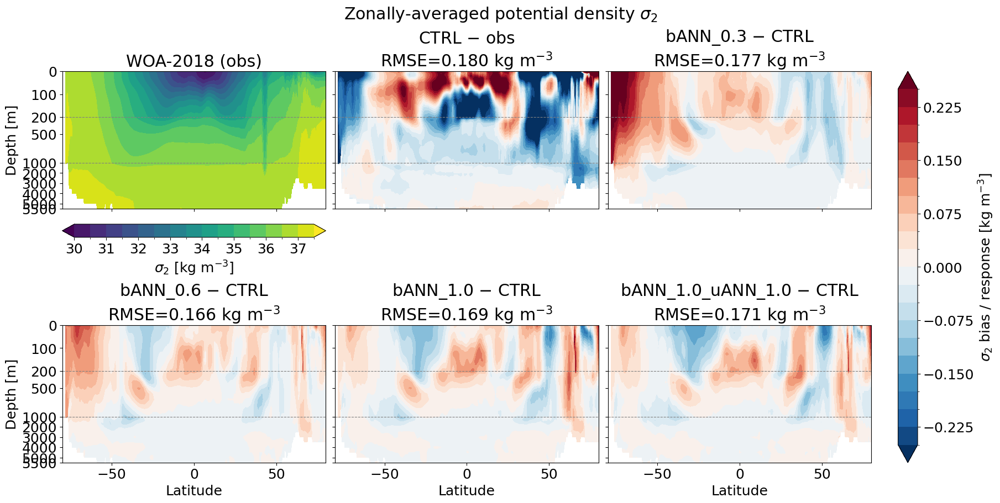

In [96]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})

geolat = exps['CTRL'].grd.geolat

# Piecewise-linear depth axis: 0-200, 200-1000, 1000-5500 m each get 1/3 of the height
d_edges = [0, 200, 1000, 5500]

def _depth_forward(d):
    d = np.asarray(d, dtype=float)
    return np.where(d <= d_edges[1], (d - d_edges[0]) / (d_edges[1] - d_edges[0]) / 3,
           np.where(d <= d_edges[2], 1 / 3 + (d - d_edges[1]) / (d_edges[2] - d_edges[1]) / 3,
                    2 / 3 + (d - d_edges[2]) / (d_edges[3] - d_edges[2]) / 3))

def _depth_inverse(y):
    y = np.asarray(y, dtype=float)
    return np.where(y <= 1 / 3, d_edges[0] + y * 3 * (d_edges[1] - d_edges[0]),
           np.where(y <= 2 / 3, d_edges[1] + (y - 1 / 3) * 3 * (d_edges[2] - d_edges[1]),
                    d_edges[2] + (y - 2 / 3) * 3 * (d_edges[3] - d_edges[2])))

# --- Zonally-averaged potential density sigma2 ---
obs = gsw.sigma2(so_obs, thetao_obs)
ctrl_field = exps['CTRL'].sigma2()

obs_levels = np.arange(30, 37.51, 0.5)
diff_levels = np.arange(-0.25, 0.251, 0.025)

fig, axes = plt.subplots(2, 3, figsize=(18, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# Panel 1: observations
im_obs = zonal_ave(obs * mask, geolat).plot.contourf(
    ax=axes[0], levels=obs_levels, cmap='viridis', extend='both', add_colorbar=False)
axes[0].set_title('WOA-2018 (obs)')
fig.colorbar(im_obs, ax=axes[0], location='bottom', label=r'$\sigma_2$ [kg m$^{-3}$]', extend='both')

# Panel 2: CTRL bias (CTRL - obs)
bias_za = zonal_ave((ctrl_field - obs) * mask, geolat)
rmse = float(np.sqrt((bias_za ** 2).mean()))
im_diff = bias_za.plot.contourf(
    ax=axes[1], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
axes[1].set_title(f'CTRL $-$ obs\nRMSE={rmse:.3f} kg m$^{{-3}}$')

# Panels 3-6: response (exp - CTRL), RMSE computed vs obs
for k, exp in enumerate(experiments):
    field = exps[exp].sigma2()
    resp_za = zonal_ave((field - ctrl_field) * mask, geolat)
    rmse = float(np.sqrt((zonal_ave((field - obs) * mask, geolat) ** 2).mean()))
    im_diff = resp_za.plot.contourf(
        ax=axes[k + 2], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
    axes[k + 2].set_title(f'{labels[exp]} $-$ CTRL\nRMSE={rmse:.3f} kg m$^{{-3}}$')

fig.colorbar(im_diff, ax=[axes[1], axes[2], axes[4], axes[5]],
             label=r'$\sigma_2$ bias / response [kg m$^{-3}$]', extend='both')

for ax in axes:
    ax.set_xlim([-80, 80])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_yscale('function', functions=(_depth_forward, _depth_inverse))
    ax.set_ylim(d_edges[3], d_edges[0])
    ax.set_yticks([0, 100, 200, 500, 1000, 2000, 3000, 4000, 5000, 5500])
    for d in (d_edges[1], d_edges[2]):
        ax.axhline(d, color='0.5', lw=0.8, ls='--')
for ax in axes[3:]:
    ax.set_xlabel('Latitude')
for ax in (axes[0], axes[3]):
    ax.set_ylabel('Depth [m]')

fig.suptitle(r'Zonally-averaged potential density $\sigma_2$')
plt.savefig('PNG_coupled_55years/sigma2_zonal_ave_bias_response.png', dpi=200, bbox_inches='tight')
plt.show()


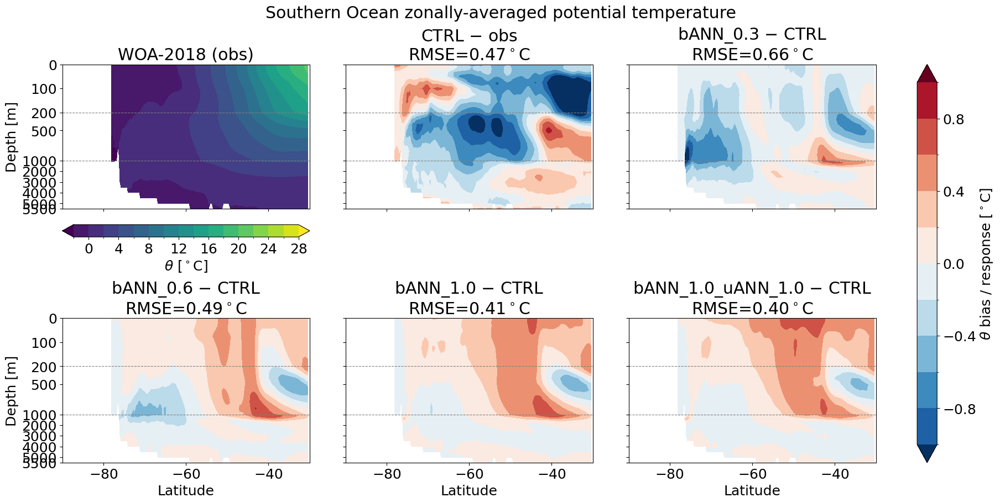

In [98]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})

geolat = exps['CTRL'].grd.geolat

# Southern Ocean region mask (lat -90 to -30)
region_mask = mask * xr.where(geolat <= -30, 1, np.nan)

# Piecewise-linear depth axis: 0-200, 200-1000, 1000-5500 m each get 1/3 of the height
d_edges = [0, 200, 1000, 5500]

def _depth_forward(d):
    d = np.asarray(d, dtype=float)
    return np.where(d <= d_edges[1], (d - d_edges[0]) / (d_edges[1] - d_edges[0]) / 3,
           np.where(d <= d_edges[2], 1 / 3 + (d - d_edges[1]) / (d_edges[2] - d_edges[1]) / 3,
                    2 / 3 + (d - d_edges[2]) / (d_edges[3] - d_edges[2]) / 3))

def _depth_inverse(y):
    y = np.asarray(y, dtype=float)
    return np.where(y <= 1 / 3, d_edges[0] + y * 3 * (d_edges[1] - d_edges[0]),
           np.where(y <= 2 / 3, d_edges[1] + (y - 1 / 3) * 3 * (d_edges[2] - d_edges[1]),
                    d_edges[2] + (y - 2 / 3) * 3 * (d_edges[3] - d_edges[2])))

# --- Southern Ocean zonally-averaged potential temperature ---
obs = thetao_obs
ctrl_field = exps['CTRL'].thetao().thetao

obs_levels = np.arange(-2, 30, 2)
diff_levels = np.arange(-1, 1.01, 0.2)

fig, axes = plt.subplots(2, 3, figsize=(18, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# Panel 1: observations
im_obs = zonal_ave(obs * region_mask, geolat).plot.contourf(
    ax=axes[0], levels=obs_levels, cmap='viridis', extend='both', add_colorbar=False)
axes[0].set_title('WOA-2018 (obs)')
fig.colorbar(im_obs, ax=axes[0], location='bottom', label='$\\theta$ [$^\\circ$C]', extend='both')

# Panel 2: CTRL bias (CTRL - obs)
bias_za = zonal_ave((ctrl_field - obs) * region_mask, geolat)
rmse = float(np.sqrt((bias_za ** 2).mean()))
im_diff = bias_za.plot.contourf(
    ax=axes[1], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
axes[1].set_title(f'CTRL $-$ obs\nRMSE={rmse:.2f}$^\\circ$C')

# Panels 3-6: response (exp - CTRL), RMSE computed vs obs
for k, exp in enumerate(experiments):
    field = exps[exp].thetao().thetao
    resp_za = zonal_ave((field - ctrl_field) * region_mask, geolat)
    rmse = float(np.sqrt((zonal_ave((field - obs) * region_mask, geolat) ** 2).mean()))
    im_diff = resp_za.plot.contourf(
        ax=axes[k + 2], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
    axes[k + 2].set_title(f'{labels[exp]} $-$ CTRL\nRMSE={rmse:.2f}$^\\circ$C')

fig.colorbar(im_diff, ax=[axes[1], axes[2], axes[4], axes[5]],
             label='$\\theta$ bias / response [$^\\circ$C]', extend='both')

for ax in axes:
    ax.set_xlim([-90, -30])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_yscale('function', functions=(_depth_forward, _depth_inverse))
    ax.set_ylim(d_edges[3], d_edges[0])
    ax.set_yticks([0, 100, 200, 500, 1000, 2000, 3000, 4000, 5000, 5500])
    for d in (d_edges[1], d_edges[2]):
        ax.axhline(d, color='0.5', lw=0.8, ls='--')
for ax in axes[3:]:
    ax.set_xlabel('Latitude')
for ax in (axes[0], axes[3]):
    ax.set_ylabel('Depth [m]')

fig.suptitle('Southern Ocean zonally-averaged potential temperature')
plt.savefig('PNG_coupled_55years/thetao_zonal_ave_bias_response_SO.png', dpi=200, bbox_inches='tight')
plt.show()


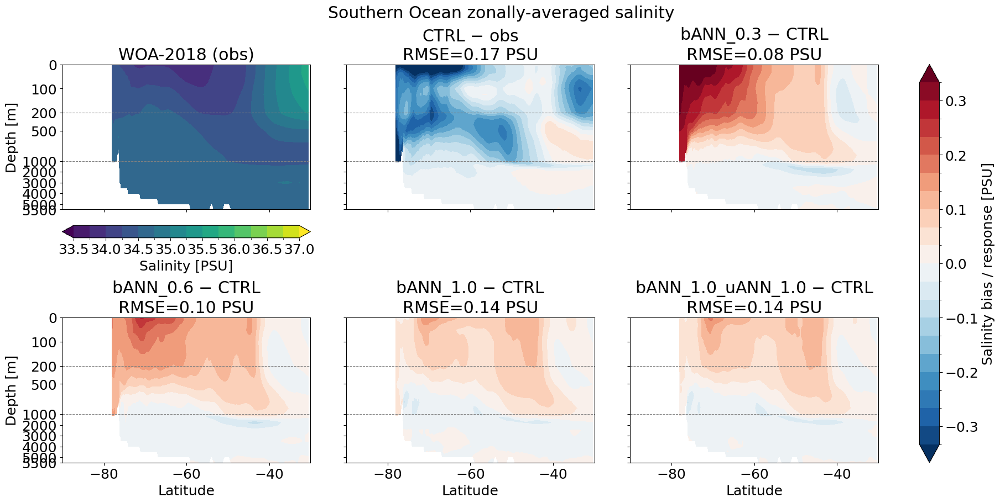

In [99]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})

geolat = exps['CTRL'].grd.geolat
region_mask = mask * xr.where(geolat <= -30, 1, np.nan)

# --- Southern Ocean zonally-averaged salinity ---
obs = so_obs
ctrl_field = exps['CTRL'].so().so

obs_levels = np.arange(33.5, 37.01, 0.25)
diff_levels = np.arange(-1, 1.01, 0.1) / 3

fig, axes = plt.subplots(2, 3, figsize=(18, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# Panel 1: observations
im_obs = zonal_ave(obs * region_mask, geolat).plot.contourf(
    ax=axes[0], levels=obs_levels, cmap='viridis', extend='both', add_colorbar=False)
axes[0].set_title('WOA-2018 (obs)')
fig.colorbar(im_obs, ax=axes[0], location='bottom', label='Salinity [PSU]', extend='both')

# Panel 2: CTRL bias (CTRL - obs)
bias_za = zonal_ave((ctrl_field - obs) * region_mask, geolat)
rmse = float(np.sqrt((bias_za ** 2).mean()))
im_diff = bias_za.plot.contourf(
    ax=axes[1], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
axes[1].set_title(f'CTRL $-$ obs\nRMSE={rmse:.2f} PSU')

# Panels 3-6: response (exp - CTRL), RMSE computed vs obs
for k, exp in enumerate(experiments):
    field = exps[exp].so().so
    resp_za = zonal_ave((field - ctrl_field) * region_mask, geolat)
    rmse = float(np.sqrt((zonal_ave((field - obs) * region_mask, geolat) ** 2).mean()))
    im_diff = resp_za.plot.contourf(
        ax=axes[k + 2], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
    axes[k + 2].set_title(f'{labels[exp]} $-$ CTRL\nRMSE={rmse:.2f} PSU')

fig.colorbar(im_diff, ax=[axes[1], axes[2], axes[4], axes[5]],
             label='Salinity bias / response [PSU]', extend='both')

for ax in axes:
    ax.set_xlim([-90, -30])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_yscale('function', functions=(_depth_forward, _depth_inverse))
    ax.set_ylim(d_edges[3], d_edges[0])
    ax.set_yticks([0, 100, 200, 500, 1000, 2000, 3000, 4000, 5000, 5500])
    for d in (d_edges[1], d_edges[2]):
        ax.axhline(d, color='0.5', lw=0.8, ls='--')
for ax in axes[3:]:
    ax.set_xlabel('Latitude')
for ax in (axes[0], axes[3]):
    ax.set_ylabel('Depth [m]')

fig.suptitle('Southern Ocean zonally-averaged salinity')
plt.savefig('PNG_coupled_55years/so_zonal_ave_bias_response_SO.png', dpi=200, bbox_inches='tight')
plt.show()


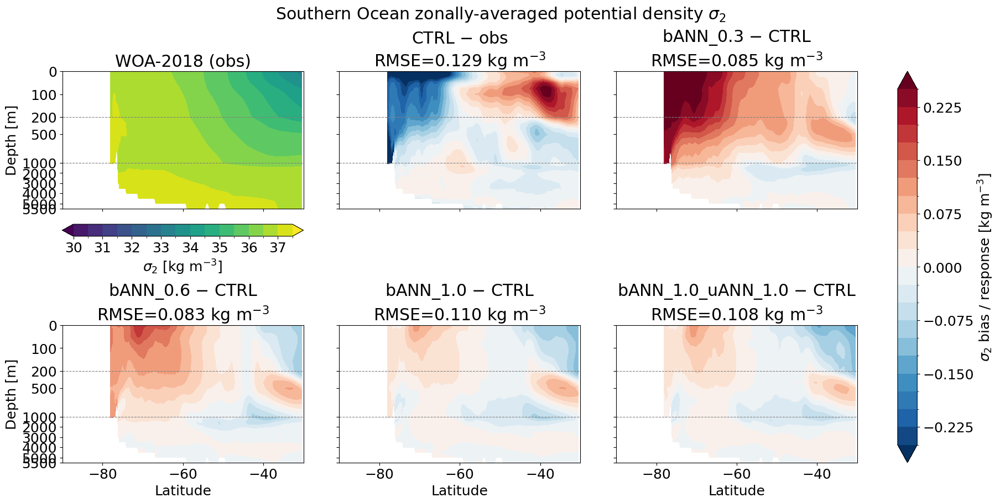

In [100]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})

geolat = exps['CTRL'].grd.geolat
region_mask = mask * xr.where(geolat <= -30, 1, np.nan)

# --- Southern Ocean zonally-averaged potential density sigma2 ---
obs = gsw.sigma2(so_obs, thetao_obs)
ctrl_field = exps['CTRL'].sigma2()

obs_levels = np.arange(30, 37.51, 0.5)
diff_levels = np.arange(-0.25, 0.251, 0.025)

fig, axes = plt.subplots(2, 3, figsize=(18, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# Panel 1: observations
im_obs = zonal_ave(obs * region_mask, geolat).plot.contourf(
    ax=axes[0], levels=obs_levels, cmap='viridis', extend='both', add_colorbar=False)
axes[0].set_title('WOA-2018 (obs)')
fig.colorbar(im_obs, ax=axes[0], location='bottom', label=r'$\sigma_2$ [kg m$^{-3}$]', extend='both')

# Panel 2: CTRL bias (CTRL - obs)
bias_za = zonal_ave((ctrl_field - obs) * region_mask, geolat)
rmse = float(np.sqrt((bias_za ** 2).mean()))
im_diff = bias_za.plot.contourf(
    ax=axes[1], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
axes[1].set_title(f'CTRL $-$ obs\nRMSE={rmse:.3f} kg m$^{{-3}}$')

# Panels 3-6: response (exp - CTRL), RMSE computed vs obs
for k, exp in enumerate(experiments):
    field = exps[exp].sigma2()
    resp_za = zonal_ave((field - ctrl_field) * region_mask, geolat)
    rmse = float(np.sqrt((zonal_ave((field - obs) * region_mask, geolat) ** 2).mean()))
    im_diff = resp_za.plot.contourf(
        ax=axes[k + 2], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
    axes[k + 2].set_title(f'{labels[exp]} $-$ CTRL\nRMSE={rmse:.3f} kg m$^{{-3}}$')

fig.colorbar(im_diff, ax=[axes[1], axes[2], axes[4], axes[5]],
             label=r'$\sigma_2$ bias / response [kg m$^{-3}$]', extend='both')

for ax in axes:
    ax.set_xlim([-90, -30])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_yscale('function', functions=(_depth_forward, _depth_inverse))
    ax.set_ylim(d_edges[3], d_edges[0])
    ax.set_yticks([0, 100, 200, 500, 1000, 2000, 3000, 4000, 5000, 5500])
    for d in (d_edges[1], d_edges[2]):
        ax.axhline(d, color='0.5', lw=0.8, ls='--')
for ax in axes[3:]:
    ax.set_xlabel('Latitude')
for ax in (axes[0], axes[3]):
    ax.set_ylabel('Depth [m]')

fig.suptitle(r'Southern Ocean zonally-averaged potential density $\sigma_2$')
plt.savefig('PNG_coupled_55years/sigma2_zonal_ave_bias_response_SO.png', dpi=200, bbox_inches='tight')
plt.show()


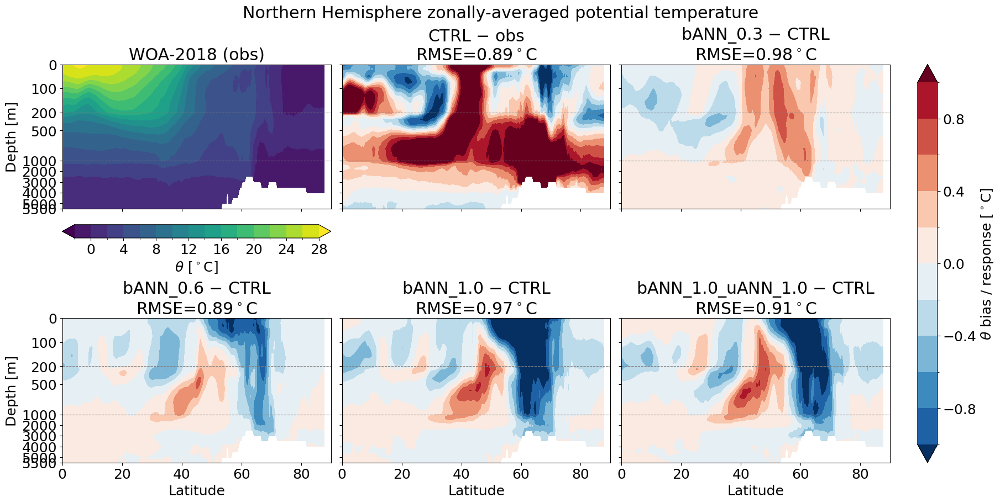

In [101]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})

geolat = exps['CTRL'].grd.geolat

# Northern Hemisphere region mask (lat 0 to 90)
region_mask = mask * xr.where(geolat >= 0, 1, np.nan)

# --- Northern Hemisphere zonally-averaged potential temperature ---
obs = thetao_obs
ctrl_field = exps['CTRL'].thetao().thetao

obs_levels = np.arange(-2, 30, 2)
diff_levels = np.arange(-1, 1.01, 0.2)

fig, axes = plt.subplots(2, 3, figsize=(18, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# Panel 1: observations
im_obs = zonal_ave(obs * region_mask, geolat).plot.contourf(
    ax=axes[0], levels=obs_levels, cmap='viridis', extend='both', add_colorbar=False)
axes[0].set_title('WOA-2018 (obs)')
fig.colorbar(im_obs, ax=axes[0], location='bottom', label='$\\theta$ [$^\\circ$C]', extend='both')

# Panel 2: CTRL bias (CTRL - obs)
bias_za = zonal_ave((ctrl_field - obs) * region_mask, geolat)
rmse = float(np.sqrt((bias_za ** 2).mean()))
im_diff = bias_za.plot.contourf(
    ax=axes[1], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
axes[1].set_title(f'CTRL $-$ obs\nRMSE={rmse:.2f}$^\\circ$C')

# Panels 3-6: response (exp - CTRL), RMSE computed vs obs
for k, exp in enumerate(experiments):
    field = exps[exp].thetao().thetao
    resp_za = zonal_ave((field - ctrl_field) * region_mask, geolat)
    rmse = float(np.sqrt((zonal_ave((field - obs) * region_mask, geolat) ** 2).mean()))
    im_diff = resp_za.plot.contourf(
        ax=axes[k + 2], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
    axes[k + 2].set_title(f'{labels[exp]} $-$ CTRL\nRMSE={rmse:.2f}$^\\circ$C')

fig.colorbar(im_diff, ax=[axes[1], axes[2], axes[4], axes[5]],
             label='$\\theta$ bias / response [$^\\circ$C]', extend='both')

for ax in axes:
    ax.set_xlim([0, 90])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_yscale('function', functions=(_depth_forward, _depth_inverse))
    ax.set_ylim(d_edges[3], d_edges[0])
    ax.set_yticks([0, 100, 200, 500, 1000, 2000, 3000, 4000, 5000, 5500])
    for d in (d_edges[1], d_edges[2]):
        ax.axhline(d, color='0.5', lw=0.8, ls='--')
for ax in axes[3:]:
    ax.set_xlabel('Latitude')
for ax in (axes[0], axes[3]):
    ax.set_ylabel('Depth [m]')

fig.suptitle('Northern Hemisphere zonally-averaged potential temperature')
plt.savefig('PNG_coupled_55years/thetao_zonal_ave_bias_response_NH.png', dpi=200, bbox_inches='tight')
plt.show()


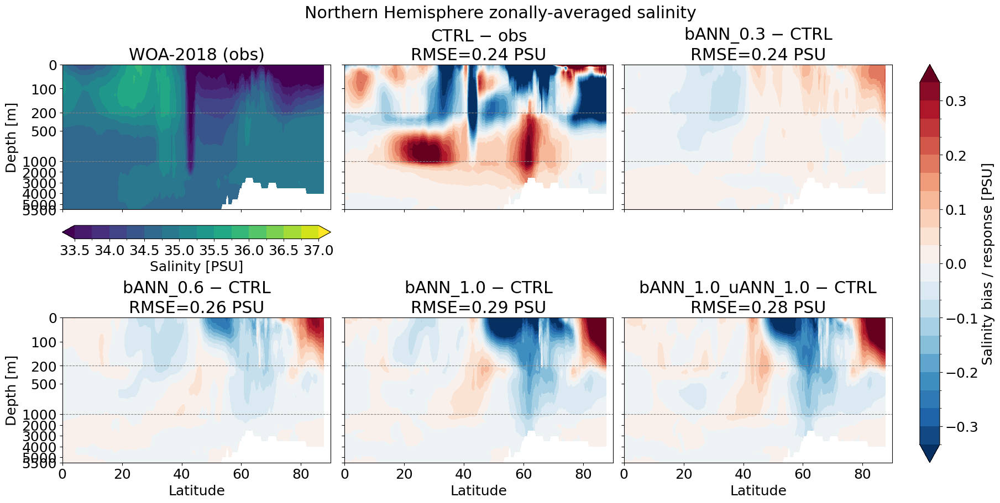

In [102]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})

geolat = exps['CTRL'].grd.geolat
region_mask = mask * xr.where(geolat >= 0, 1, np.nan)

# --- Northern Hemisphere zonally-averaged salinity ---
obs = so_obs
ctrl_field = exps['CTRL'].so().so

obs_levels = np.arange(33.5, 37.01, 0.25)
diff_levels = np.arange(-1, 1.01, 0.1) / 3

fig, axes = plt.subplots(2, 3, figsize=(18, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# Panel 1: observations
im_obs = zonal_ave(obs * region_mask, geolat).plot.contourf(
    ax=axes[0], levels=obs_levels, cmap='viridis', extend='both', add_colorbar=False)
axes[0].set_title('WOA-2018 (obs)')
fig.colorbar(im_obs, ax=axes[0], location='bottom', label='Salinity [PSU]', extend='both')

# Panel 2: CTRL bias (CTRL - obs)
bias_za = zonal_ave((ctrl_field - obs) * region_mask, geolat)
rmse = float(np.sqrt((bias_za ** 2).mean()))
im_diff = bias_za.plot.contourf(
    ax=axes[1], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
axes[1].set_title(f'CTRL $-$ obs\nRMSE={rmse:.2f} PSU')

# Panels 3-6: response (exp - CTRL), RMSE computed vs obs
for k, exp in enumerate(experiments):
    field = exps[exp].so().so
    resp_za = zonal_ave((field - ctrl_field) * region_mask, geolat)
    rmse = float(np.sqrt((zonal_ave((field - obs) * region_mask, geolat) ** 2).mean()))
    im_diff = resp_za.plot.contourf(
        ax=axes[k + 2], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
    axes[k + 2].set_title(f'{labels[exp]} $-$ CTRL\nRMSE={rmse:.2f} PSU')

fig.colorbar(im_diff, ax=[axes[1], axes[2], axes[4], axes[5]],
             label='Salinity bias / response [PSU]', extend='both')

for ax in axes:
    ax.set_xlim([0, 90])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_yscale('function', functions=(_depth_forward, _depth_inverse))
    ax.set_ylim(d_edges[3], d_edges[0])
    ax.set_yticks([0, 100, 200, 500, 1000, 2000, 3000, 4000, 5000, 5500])
    for d in (d_edges[1], d_edges[2]):
        ax.axhline(d, color='0.5', lw=0.8, ls='--')
for ax in axes[3:]:
    ax.set_xlabel('Latitude')
for ax in (axes[0], axes[3]):
    ax.set_ylabel('Depth [m]')

fig.suptitle('Northern Hemisphere zonally-averaged salinity')
plt.savefig('PNG_coupled_55years/so_zonal_ave_bias_response_NH.png', dpi=200, bbox_inches='tight')
plt.show()


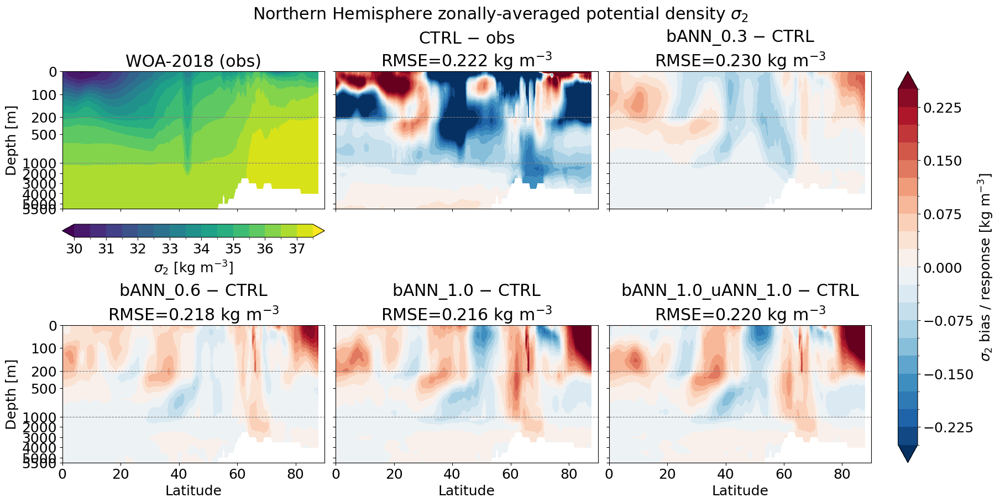

In [103]:
%matplotlib inline
plt.rcParams.update({'font.size': 18})

geolat = exps['CTRL'].grd.geolat
region_mask = mask * xr.where(geolat >= 0, 1, np.nan)

# --- Northern Hemisphere zonally-averaged potential density sigma2 ---
obs = gsw.sigma2(so_obs, thetao_obs)
ctrl_field = exps['CTRL'].sigma2()

obs_levels = np.arange(30, 37.51, 0.5)
diff_levels = np.arange(-0.25, 0.251, 0.025)

fig, axes = plt.subplots(2, 3, figsize=(18, 9), sharex=True, sharey=True, layout='constrained')
axes = axes.ravel()

# Panel 1: observations
im_obs = zonal_ave(obs * region_mask, geolat).plot.contourf(
    ax=axes[0], levels=obs_levels, cmap='viridis', extend='both', add_colorbar=False)
axes[0].set_title('WOA-2018 (obs)')
fig.colorbar(im_obs, ax=axes[0], location='bottom', label=r'$\sigma_2$ [kg m$^{-3}$]', extend='both')

# Panel 2: CTRL bias (CTRL - obs)
bias_za = zonal_ave((ctrl_field - obs) * region_mask, geolat)
rmse = float(np.sqrt((bias_za ** 2).mean()))
im_diff = bias_za.plot.contourf(
    ax=axes[1], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
axes[1].set_title(f'CTRL $-$ obs\nRMSE={rmse:.3f} kg m$^{{-3}}$')

# Panels 3-6: response (exp - CTRL), RMSE computed vs obs
for k, exp in enumerate(experiments):
    field = exps[exp].sigma2()
    resp_za = zonal_ave((field - ctrl_field) * region_mask, geolat)
    rmse = float(np.sqrt((zonal_ave((field - obs) * region_mask, geolat) ** 2).mean()))
    im_diff = resp_za.plot.contourf(
        ax=axes[k + 2], levels=diff_levels, cmap='RdBu_r', extend='both', add_colorbar=False)
    axes[k + 2].set_title(f'{labels[exp]} $-$ CTRL\nRMSE={rmse:.3f} kg m$^{{-3}}$')

fig.colorbar(im_diff, ax=[axes[1], axes[2], axes[4], axes[5]],
             label=r'$\sigma_2$ bias / response [kg m$^{-3}$]', extend='both')

for ax in axes:
    ax.set_xlim([0, 90])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_yscale('function', functions=(_depth_forward, _depth_inverse))
    ax.set_ylim(d_edges[3], d_edges[0])
    ax.set_yticks([0, 100, 200, 500, 1000, 2000, 3000, 4000, 5000, 5500])
    for d in (d_edges[1], d_edges[2]):
        ax.axhline(d, color='0.5', lw=0.8, ls='--')
for ax in axes[3:]:
    ax.set_xlabel('Latitude')
for ax in (axes[0], axes[3]):
    ax.set_ylabel('Depth [m]')

fig.suptitle(r'Northern Hemisphere zonally-averaged potential density $\sigma_2$')
plt.savefig('PNG_coupled_55years/sigma2_zonal_ave_bias_response_NH.png', dpi=200, bbox_inches='tight')
plt.show()


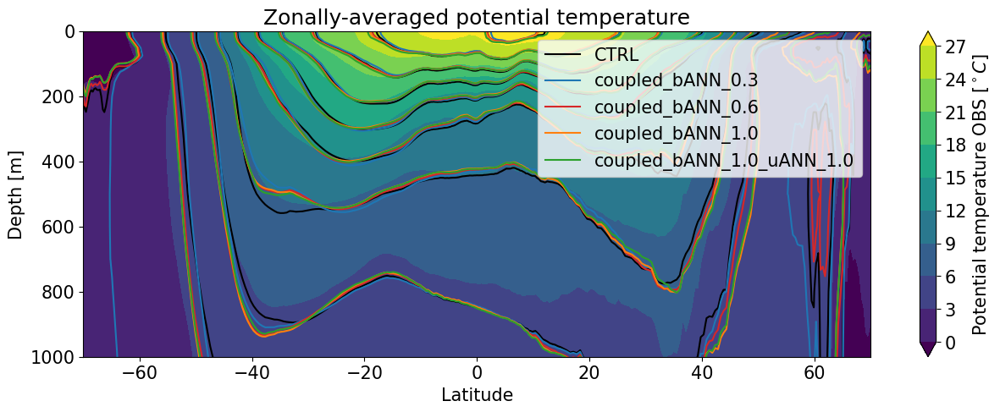

In [46]:
plt.rcParams.update({'font.size': 15})
geolat = exps['CTRL'].grd.geolat
levels=np.arange(0,30,3)
cs = zonal_ave(thetao_obs, geolat).plot.contourf(levels=levels, cmap='viridis', extend='both',
                                                 cbar_kwargs={'label': 'Potential temperature OBS [$^\circ C$]'})
zonal_ave(exps['CTRL'].thetao().thetao, geolat).plot.contour(levels=levels, colors='k')
zonal_ave(exps['coupled_bANN_0.3'].thetao().thetao, geolat).plot.contour(levels=levels, colors='tab:blue')
zonal_ave(exps['coupled_bANN_0.6'].thetao().thetao, geolat).plot.contour(levels=levels, colors='tab:red')
zonal_ave(exps['coupled_bANN_1.0'].thetao().thetao, geolat).plot.contour(levels=levels, colors='tab:orange')
zonal_ave(exps['coupled_bANN_1.0_uANN_1.0'].thetao().thetao, geolat).plot.contour(levels=levels, colors='tab:green')
plt.ylim([0,1000])
plt.xlim([-70,70])
plt.gca().invert_yaxis()
plt.xlabel('Latitude')
plt.title('Zonally-averaged potential temperature')
plt.ylabel('Depth [m]')
plt.plot([None], [None], color='k', label='CTRL')
plt.plot([None], [None], color='tab:blue', label='coupled_bANN_0.3')
plt.plot([None], [None], color='tab:red', label='coupled_bANN_0.6')
plt.plot([None], [None], color='tab:orange', label='coupled_bANN_1.0')
plt.plot([None], [None], color='tab:green', label='coupled_bANN_1.0_uANN_1.0')
plt.legend()
plt.savefig(f'PNG_coupled_55years/thetao_zonal_ave.png',dpi=200, bbox_inches='tight')


# Zonally-averaged density

In [12]:
import gsw
woa_obs = catalog['woa-2018-tx2_3v2-annual-all'].to_dask()
geolon = exps['CTRL'].grd.geolon

In [15]:
# Simplified expression for Potential density anomaly ref 2000 dbar
sigma2_obs = gsw.sigma2(woa_obs.so, woa_obs.thetao).compute() + geolon*0
geolat = exps['CTRL'].grd.geolat

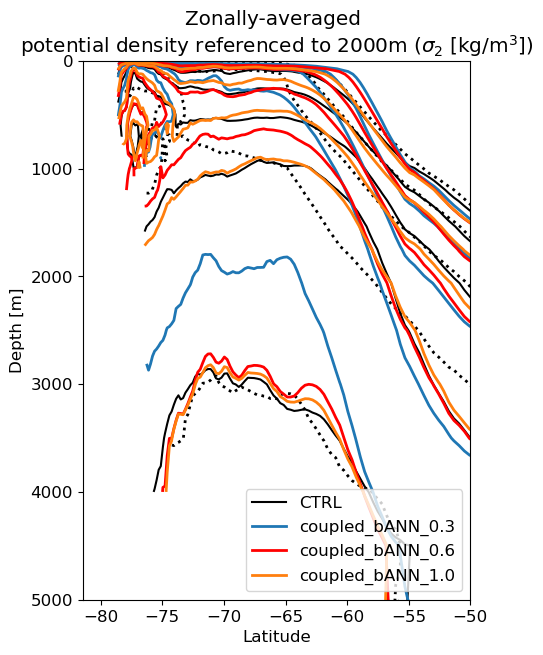

In [104]:
%matplotlib inline
plt.rcParams.update({'font.size': 12})
plt.figure(figsize=(5,7))
levels = np.array([36.65,36.75,36.85,36.95, 37.05])
zonal_ave(sigma2_obs, geolat).plot.contour(levels=levels, colors='k', linestyles=':', linewidths=2)
zonal_ave(exps['CTRL'].sigma2(), geolat).plot.contour(levels=levels, colors='k')
zonal_ave(exps['coupled_bANN_0.3'].sigma2(), geolat).plot.contour(levels=levels, colors='tab:blue', linewidths=2)
zonal_ave(exps['coupled_bANN_0.6'].sigma2(), geolat).plot.contour(levels=levels, colors='red', linewidths=2)
zonal_ave(exps['coupled_bANN_1.0'].sigma2(), geolat).plot.contour(levels=levels, colors='tab:orange', linewidths=2)
# zonal_ave(exps['coupled_bANN_1.0_uANN_1.0'].sigma2(), geolat).plot.contour(levels=levels, colors='tab:green', linewidths=2)
plt.ylim([0,5000])
plt.xlim([None,-50])
plt.gca().invert_yaxis()
plt.xlabel('Latitude')
plt.title('Zonally-averaged \npotential density referenced to 2000m ($\sigma_2$ [kg/m$^3$])')
plt.ylabel('Depth [m]')
plt.plot([None], [None], color='k', label='CTRL')
plt.plot([None], [None], color='tab:blue', label='coupled_bANN_0.3', linewidth=2)
plt.plot([None], [None], color='red', label='coupled_bANN_0.6', linewidth=2)
plt.plot([None], [None], color='tab:orange', label='coupled_bANN_1.0', linewidth=2)
# plt.plot([None], [None], color='tab:green', label='coupled_bANN_1.0_uANN_1.0', linewidth=2)
plt.legend(loc='lower right')
plt.savefig(f'PNG_coupled_55years/sigma2_zonal_ave.png',dpi=200, bbox_inches='tight')
plt.show()


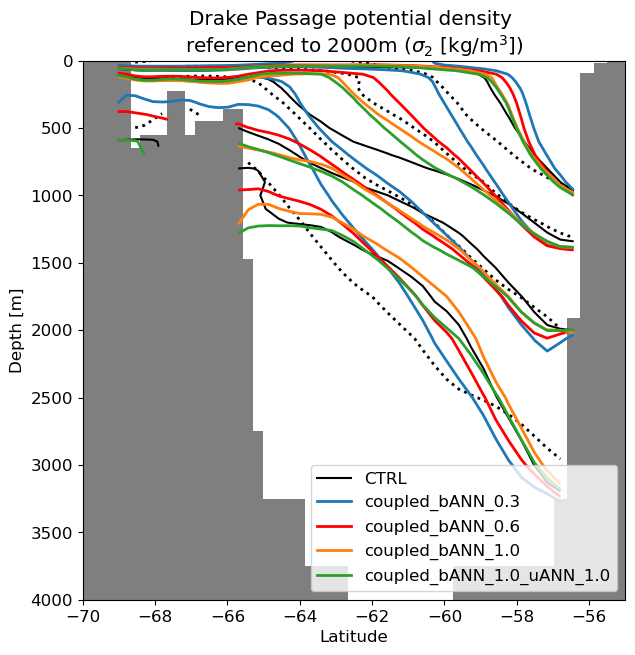

In [124]:
%matplotlib inline
plt.rcParams.update({'font.size': 12})
plt.figure(figsize=(7,7))
#levels = np.array([36.65,36.75,36.85,36.95, 37.05])
levels = np.array([36.25, 36.5, 36.75, 36.9])
np.isnan(sigma2_obs.sel(xh=-70,method='nearest')).plot(cmap='gray_r', vmin=0, vmax=2, add_colorbar=False)
sigma2_obs.sel(xh=-70,method='nearest').plot.contour(levels=levels, colors='k', linestyles=':', linewidths=2)
exps['CTRL'].sigma2().sel(xh=-70,method='nearest').plot.contour(levels=levels, colors='k')
exps['coupled_bANN_0.3'].sigma2().sel(xh=-70,method='nearest').plot.contour(levels=levels, colors='tab:blue', linewidths=2)
exps['coupled_bANN_0.6'].sigma2().sel(xh=-70,method='nearest').plot.contour(levels=levels, colors='red', linewidths=2)
exps['coupled_bANN_1.0'].sigma2().sel(xh=-70,method='nearest').plot.contour(levels=levels, colors='tab:orange', linewidths=2)
exps['coupled_bANN_1.0_uANN_1.0'].sigma2().sel(xh=-70,method='nearest').plot.contour(levels=levels, colors='tab:green', linewidths=2)
plt.ylim([0,4000])
plt.xlim([-70,-55])
plt.gca().invert_yaxis()
plt.xlabel('Latitude')
plt.title('Drake Passage potential density \nreferenced to 2000m ($\sigma_2$ [kg/m$^3$])')
plt.ylabel('Depth [m]')
plt.plot([None], [None], color='k', label='CTRL')
plt.plot([None], [None], color='tab:blue', label='coupled_bANN_0.3', linewidth=2)
plt.plot([None], [None], color='red', label='coupled_bANN_0.6', linewidth=2)
plt.plot([None], [None], color='tab:orange', label='coupled_bANN_1.0', linewidth=2)
plt.plot([None], [None], color='tab:green', label='coupled_bANN_1.0_uANN_1.0', linewidth=2)
plt.legend(loc='lower right')
plt.savefig(f'PNG_coupled_55years/sigma2_Drake.png',dpi=200, bbox_inches='tight')
plt.show()


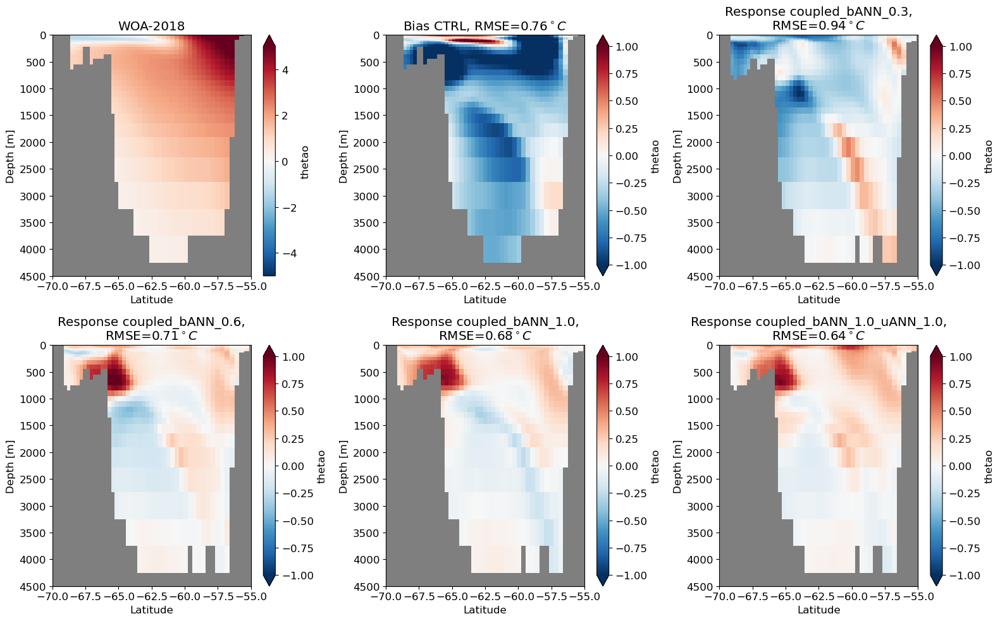

In [78]:
%matplotlib inline
plt.rcParams.update({'font.size': 12})
plt.figure(figsize=(16,10))
for j, exp in enumerate(['obs', 'CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']):
    plt.subplot(2,3,j+1)
    np.isnan(thetao_obs.sel(xh=-70,method='nearest')).plot(cmap='gray_r', vmin=0, vmax=2, add_colorbar=False)
    if exp =='obs':
        thetao_obs.sel(xh=-70,method='nearest').plot(vmin=-5)
    elif exp == 'CTRL':
        thetao_ctrl = exps[exp].thetao().thetao
        error = (thetao_ctrl - thetao_obs).sel(xh=-70,method='nearest').sel(yh=slice(-70,-55))
        error.plot(vmin=-1)
        error = float(np.sqrt((error**2).mean()))
    else:
        thetao = exps[exp].thetao().thetao
        response = thetao - thetao_ctrl
        error = (thetao - thetao_obs).sel(xh=-70,method='nearest').sel(yh=slice(-70,-55))
        response.sel(xh=-70,method='nearest').plot(vmin=-1)
        error = float(np.sqrt((error**2).mean()))
    plt.ylim([0,4500])
    plt.xlim([-70,-55])
    plt.gca().invert_yaxis()
    plt.xlabel('Latitude')
    plt.ylabel('Depth [m]')

    if exp == 'obs':
        plt.title('WOA-2018')
    elif exp=='CTRL':   
        plt.title('Bias ' + exp + f', RMSE={error:.2f}$^\circ C$')
    else:
        plt.title('Response ' + exp + f',\nRMSE={error:.2f}$^\circ C$')

plt.tight_layout()
plt.savefig(f'PNG_coupled_55years/thetao_Drake.png',dpi=200, bbox_inches='tight')
plt.show()


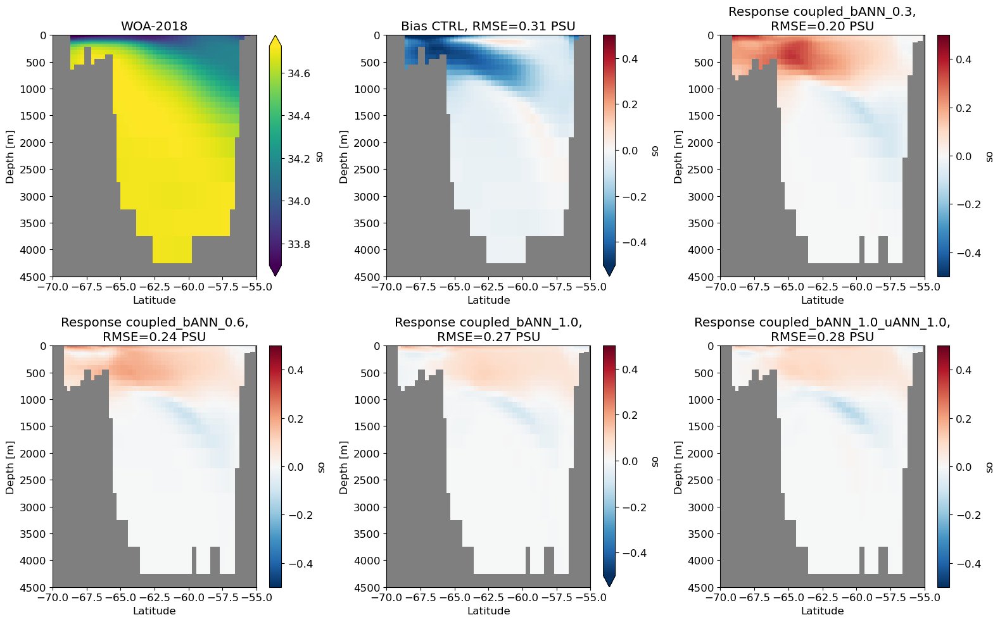

In [80]:
%matplotlib inline
plt.rcParams.update({'font.size': 12})

so_obs = woa_obs.so.values + 0*exps['CTRL'].so().so

plt.figure(figsize=(16,10))
for j, exp in enumerate(['obs', 'CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']):
    plt.subplot(2,3,j+1)
    np.isnan(so_obs.sel(xh=-70,method='nearest')).plot(cmap='gray_r', vmin=0, vmax=2, add_colorbar=False)
    if exp =='obs':
        so_obs.sel(xh=-70,method='nearest').sel(yh=slice(-70,-55)).plot(robust=True)
    elif exp == 'CTRL':
        so_ctrl = exps[exp].so().so
        error = (so_ctrl - so_obs).sel(xh=-70,method='nearest').sel(yh=slice(-70,-55))
        error.plot(vmin=-0.5, vmax=0.5, cmap='RdBu_r')
        error = float(np.sqrt((error**2).mean()))
    else:
        so = exps[exp].so().so
        response = so - so_ctrl
        error = (so - so_obs).sel(xh=-70,method='nearest').sel(yh=slice(-70,-55))
        response.sel(xh=-70,method='nearest').plot(vmin=-0.5, vmax=0.5, cmap='RdBu_r')
        error = float(np.sqrt((error**2).mean()))
    plt.ylim([0,4500])
    plt.xlim([-70,-55])
    plt.gca().invert_yaxis()
    plt.xlabel('Latitude')
    plt.ylabel('Depth [m]')

    if exp == 'obs':
        plt.title('WOA-2018')
    elif exp=='CTRL':   
        plt.title('Bias ' + exp + f', RMSE={error:.2f} PSU')
    else:
        plt.title('Response ' + exp + f',\nRMSE={error:.2f} PSU')

plt.tight_layout()
plt.savefig(f'PNG_coupled_55years/so_Drake.png',dpi=200, bbox_inches='tight')
plt.show()


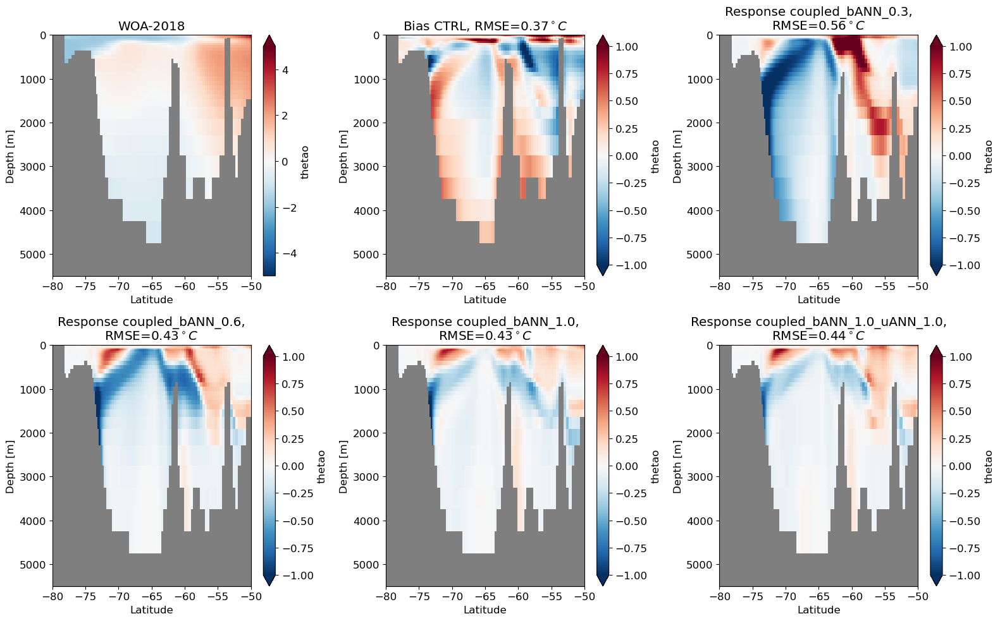

In [84]:
%matplotlib inline
plt.rcParams.update({'font.size': 12})
plt.figure(figsize=(16,10))
for j, exp in enumerate(['obs', 'CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']):
    plt.subplot(2,3,j+1)
    np.isnan(thetao_obs.sel(xh=-42,method='nearest')).plot(cmap='gray_r', vmin=0, vmax=2, add_colorbar=False)
    if exp =='obs':
        thetao_obs.sel(xh=-42,method='nearest').plot(vmin=-5)
    elif exp == 'CTRL':
        thetao_ctrl = exps[exp].thetao().thetao
        error = (thetao_ctrl - thetao_obs).sel(xh=-42,method='nearest').sel(yh=slice(-80,-50))
        error.plot(vmin=-1)
        error = float(np.sqrt((error**2).mean()))
    else:
        thetao = exps[exp].thetao().thetao
        response = thetao - thetao_ctrl
        error = (thetao - thetao_obs).sel(xh=-42,method='nearest').sel(yh=slice(-80,-50))
        response.sel(xh=-42,method='nearest').plot(vmin=-1)
        error = float(np.sqrt((error**2).mean()))
    plt.ylim([0,5500])
    plt.xlim([-80,-50])
    plt.gca().invert_yaxis()
    plt.xlabel('Latitude')
    plt.ylabel('Depth [m]')

    if exp == 'obs':
        plt.title('WOA-2018')
    elif exp=='CTRL':   
        plt.title('Bias ' + exp + f', RMSE={error:.2f}$^\circ C$')
    else:
        plt.title('Response ' + exp + f',\nRMSE={error:.2f}$^\circ C$')

plt.tight_layout()
plt.savefig(f'PNG_coupled_55years/thetao_Wadell.png',dpi=200, bbox_inches='tight')
plt.show()


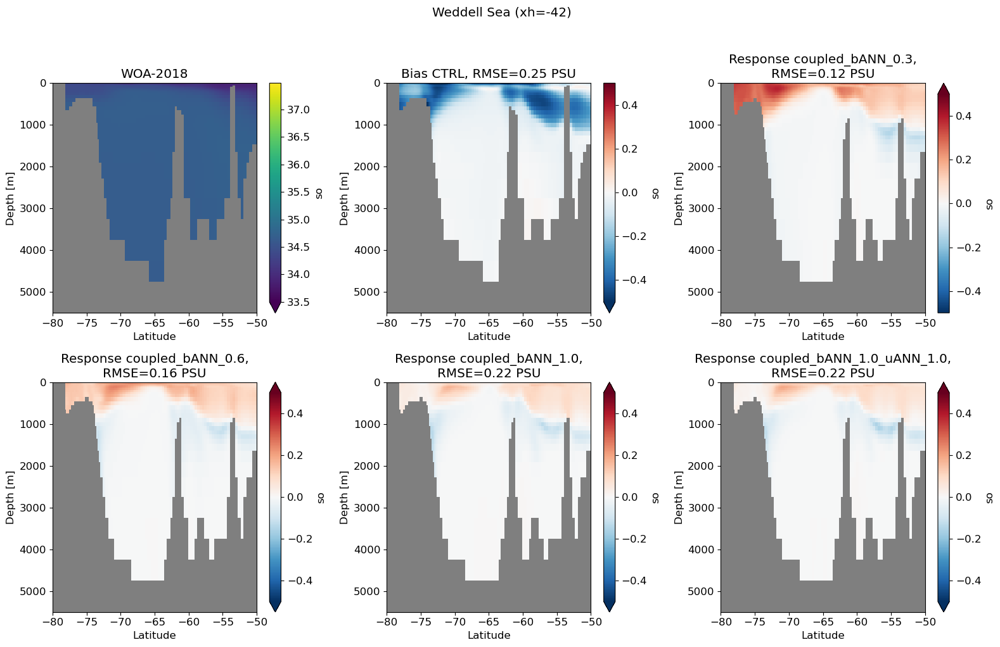

In [86]:
%matplotlib inline
plt.rcParams.update({'font.size': 12})

so_obs = woa_obs.so.values + 0*exps['CTRL'].so().so

plt.figure(figsize=(16,10))
for j, exp in enumerate(['obs', 'CTRL', 'coupled_bANN_0.3', 'coupled_bANN_0.6', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']):
    plt.subplot(2,3,j+1)
    np.isnan(so_obs.sel(xh=-42,method='nearest')).plot(cmap='gray_r', vmin=0, vmax=2, add_colorbar=False)
    if exp =='obs':
        so_obs.sel(xh=-42,method='nearest').plot(vmin=33.5)
    elif exp == 'CTRL':
        so_ctrl = exps[exp].so().so
        error = (so_ctrl - so_obs).sel(xh=-42,method='nearest').sel(yh=slice(-80,-50))
        error.plot(vmin=-0.5, vmax=0.5, cmap='RdBu_r')
        error = float(np.sqrt((error**2).mean()))
    else:
        so = exps[exp].so().so
        response = so - so_ctrl
        error = (so - so_obs).sel(xh=-42,method='nearest').sel(yh=slice(-80,-50))
        response.sel(xh=-42,method='nearest').plot(vmin=-0.5, vmax=0.5, cmap='RdBu_r')
        error = float(np.sqrt((error**2).mean()))
    plt.ylim([0,5500])
    plt.xlim([-80,-50])
    plt.gca().invert_yaxis()
    plt.xlabel('Latitude')
    plt.ylabel('Depth [m]')

    if exp == 'obs':
        plt.title('WOA-2018')
    elif exp=='CTRL':   
        plt.title('Bias ' + exp + f', RMSE={error:.2f} PSU')
    else:
        plt.title('Response ' + exp + f',\nRMSE={error:.2f} PSU')

plt.suptitle('Weddell Sea (xh=-42)', y=1.02)
plt.tight_layout()
plt.savefig(f'PNG_coupled_55years/so_Weddell.png',dpi=200, bbox_inches='tight')
plt.show()


In [96]:
sigma2_obs.xh

<xarray.DataArray 'xh' (xh: 540)>
array([-286.666667, -286.      , -285.333333, ...,   71.333333,   72.      ,
         72.666667])
Coordinates:
  * xh       (xh) float64 -286.7 -286.0 -285.3 -284.7 ... 70.67 71.33 72.0 72.67

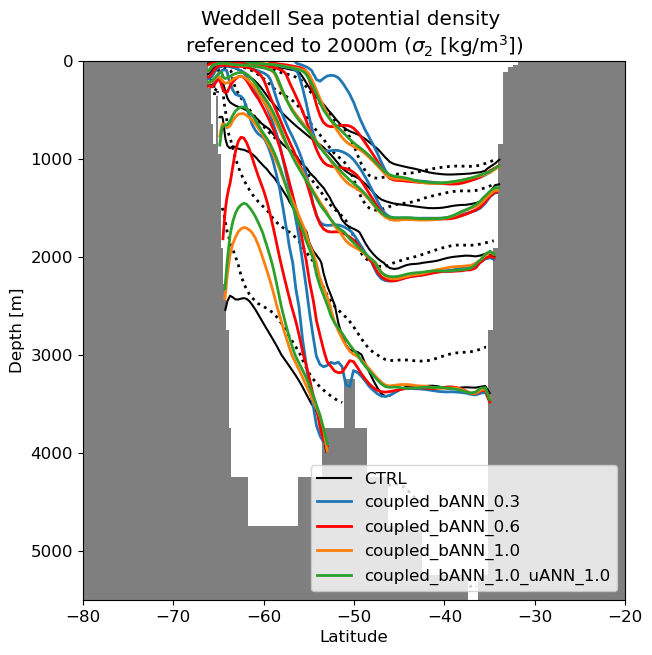

In [123]:
%matplotlib inline
plt.rcParams.update({'font.size': 12})
plt.figure(figsize=(7,7))
#levels = np.array([36.65,36.75,36.85,36.95, 37.05])
levels = np.array([36.25, 36.5, 36.75, 36.9, 37])
np.isnan(sigma2_obs.sel(xh=-230,method='nearest')).plot(cmap='gray_r', vmin=0, vmax=2, add_colorbar=False)
sigma2_obs.sel(xh=-230,method='nearest').plot.contour(levels=levels, colors='k', linestyles=':', linewidths=2)
exps['CTRL'].sigma2().sel(xh=-230,method='nearest').plot.contour(levels=levels, colors='k')
exps['coupled_bANN_0.3'].sigma2().sel(xh=-230,method='nearest').plot.contour(levels=levels, colors='tab:blue', linewidths=2)
exps['coupled_bANN_0.6'].sigma2().sel(xh=-230,method='nearest').plot.contour(levels=levels, colors='red', linewidths=2)
exps['coupled_bANN_1.0'].sigma2().sel(xh=-230,method='nearest').plot.contour(levels=levels, colors='tab:orange', linewidths=2)
exps['coupled_bANN_1.0_uANN_1.0'].sigma2().sel(xh=-230,method='nearest').plot.contour(levels=levels, colors='tab:green', linewidths=2)
plt.ylim([0,5500])
plt.xlim([-80,-20])
plt.gca().invert_yaxis()
plt.xlabel('Latitude')
plt.title('Weddell Sea potential density \nreferenced to 2000m ($\sigma_2$ [kg/m$^3$])')
plt.ylabel('Depth [m]')
plt.plot([None], [None], color='k', label='CTRL')
plt.plot([None], [None], color='tab:blue', label='coupled_bANN_0.3', linewidth=2)
plt.plot([None], [None], color='red', label='coupled_bANN_0.6', linewidth=2)
plt.plot([None], [None], color='tab:orange', label='coupled_bANN_1.0', linewidth=2)
plt.plot([None], [None], color='tab:green', label='coupled_bANN_1.0_uANN_1.0', linewidth=2)
plt.legend(loc='lower right')
plt.savefig(f'PNG_coupled_55years/sigma2_Australia.png',dpi=200, bbox_inches='tight')
plt.show()


# MLD bias-response

In [92]:
# See https://webext.cgd.ucar.edu/GIAF/g.e30_a08g.GW_JRA.TL319_t232_wgx3_hycom1_N75.2026.006/ocn/mld.html for example
import intake
grd = exps['CTRL'].grd
obs = 'mld-deboyer-2023-tx2_3v2'
catalog = intake.open_catalog('/glade/u/home/gmarques/libs/oce-catalogs/reference-datasets.yml')
mld_obs = catalog[obs].to_dask()
mld_obs = mld_obs.rename({'time' : 'month'})
mld_obs["month"] = np.arange(1,len(mld_obs.month)+1)
months = [0,1,2]
obs_JFM = np.ma.masked_invalid(mld_obs.mld.isel(month=months).mean('month').values)
months = [6,7,8]
obs_JAS = np.ma.masked_invalid(mld_obs.mld.isel(month=months).mean('month').values)
obs_winter = obs_JAS.copy(); obs_summer = obs_JAS.copy()
j = int(np.abs( grd.geolat[:,0] - 0. ).argmin())
obs_winter[j::,:] = obs_JFM[j::,:]
obs_summer[0:j,:] = obs_JFM[0:j,:]

obs_winter = obs_winter.data + grd.geolon*0
obs_summer = obs_summer.data + grd.geolon*0

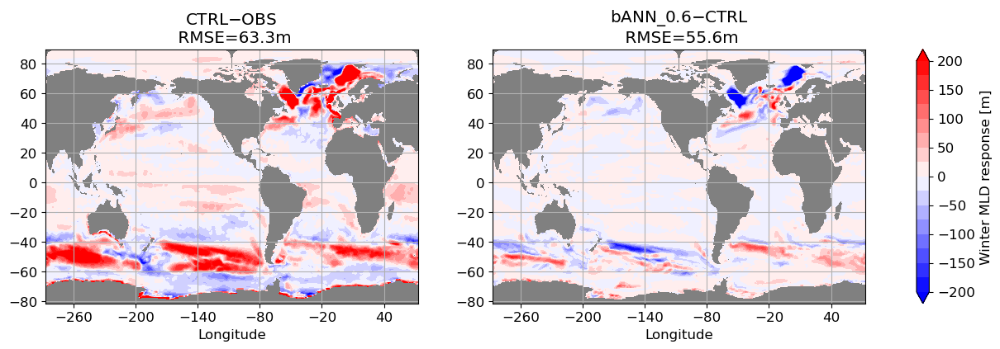

In [99]:
from mom6_tools.m6plot import myStats

%matplotlib inline
plt.figure(figsize=(16,4))

exp = 'coupled_bANN_0.6'
label='bANN_0.6'


vmax=200
geolon = exps['CTRL'].grd.geolon
geolat = exps['CTRL'].grd.geolat
area = np.ma.masked_invalid(exps['CTRL'].area) # All computations including area will be masked array from now on
control_winter = exps['CTRL'].mld_winter().MLD_winter
bias = control_winter - obs_winter

plt.subplot(1,2,1)
im = plt.contourf(geolon, geolat, bias, extend='both', levels=np.linspace(-vmax, vmax, 17), cmap='bwr')
_, _, _, _, error = myStats(control_winter - obs_winter, area)
plt.title(f'CTRL$-$OBS \n RMSE={error:.1f}m')
plt.gca().set_facecolor('gray')
plt.xticks(np.arange(-260,60,60))
plt.xlabel('Longitude')
plt.grid()

plt.subplot(1,2,2)
model_winter = exps[exp].mld_winter().MLD_winter
response = model_winter - control_winter
_, _, _, _, error = myStats(model_winter - obs_winter, area)
im = plt.contourf(geolon, geolat, response, extend='both', levels=np.linspace(-vmax, vmax, 17), cmap='bwr')
plt.title(f'{label}$-$CTRL \n RMSE={error:.1f}m')
plt.gca().set_facecolor('gray')
plt.xticks(np.arange(-260,60,60))
plt.xlabel('Longitude')
plt.grid()


plt.colorbar(im,ax=plt.gcf().axes, label='Winter MLD response [m]', extend='both')
plt.savefig(f'PNG_coupled_55years/MLD_winter_response_{exp}.png',dpi=200, bbox_inches='tight')

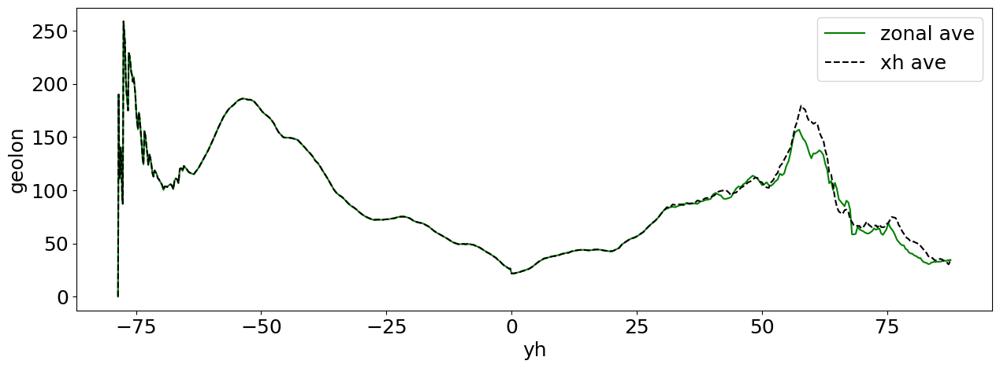

In [72]:
%matplotlib inline
zonal_ave(obs_winter, grd.geolat).plot(label='zonal ave', color='g')
zonal_ave(obs_winter, None).plot(color='k', label='xh ave', ls='--')
plt.legend()
plt.show()

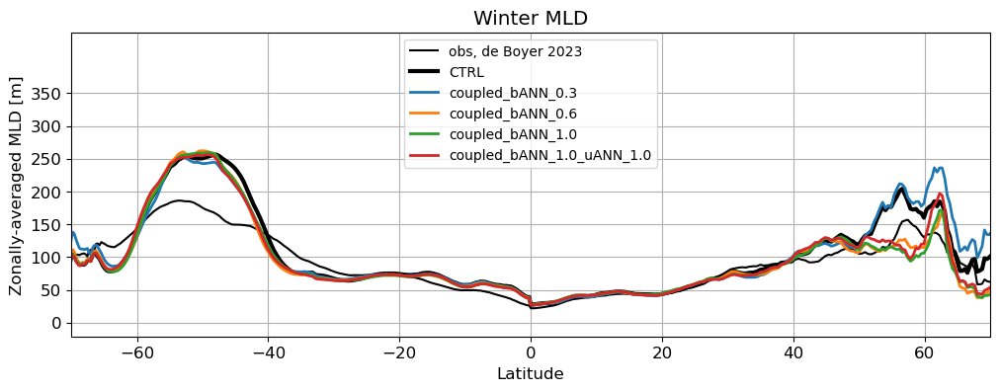

In [100]:
plt.figure(figsize=(12,4))
plt.rcParams.update({'font.size': 12})
geolat = grd.geolat
zonal_ave(obs_winter, geolat).plot(label='obs, de Boyer 2023', color='k')
model_winter = exps['CTRL'].mld_winter().MLD_winter
zonal_ave(model_winter, geolat).plot(label='CTRL', lw=3, color='k')
model_winter = exps['coupled_bANN_0.3'].mld_winter().MLD_winter
zonal_ave(model_winter, geolat).plot(label='coupled_bANN_0.3', lw=2)
model_winter = exps['coupled_bANN_0.6'].mld_winter().MLD_winter
zonal_ave(model_winter, geolat).plot(label='coupled_bANN_0.6', lw=2)
model_winter = exps['coupled_bANN_1.0'].mld_winter().MLD_winter
zonal_ave(model_winter, geolat).plot(label='coupled_bANN_1.0', lw=2)
model_winter = exps['coupled_bANN_1.0_uANN_1.0'].mld_winter().MLD_winter
zonal_ave(model_winter, geolat).plot(label='coupled_bANN_1.0_uANN_1.0', lw=2)
plt.xlim(-70,70)
plt.legend(fontsize=10)
plt.grid()
plt.yticks(np.arange(0,400,50));
plt.xlabel('Latitude')
plt.title('Winter MLD')
plt.ylabel('Zonally-averaged MLD [m]')
plt.savefig('PNG_coupled_55years/winter_MLD_zonal.png', dpi=200)

### MLD RMSE Zonal plot

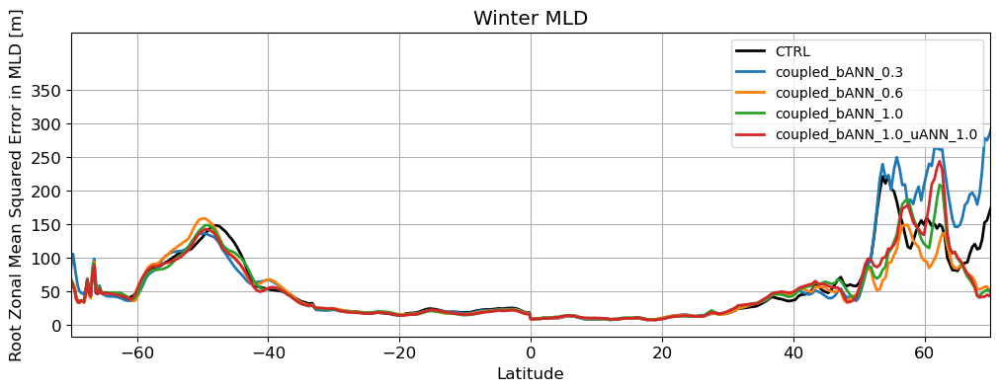

In [101]:
plt.figure(figsize=(12,4))
plt.rcParams.update({'font.size': 12})

model_winter = exps['CTRL'].mld_winter().MLD_winter
np.sqrt(zonal_ave(((model_winter - obs_winter)**2), geolat)).plot(label='CTRL', lw=2, color='k')

model_winter = exps['coupled_bANN_0.3'].mld_winter().MLD_winter
np.sqrt(zonal_ave(((model_winter - obs_winter)**2), geolat)).plot(label='coupled_bANN_0.3', lw=2)

model_winter = exps['coupled_bANN_0.6'].mld_winter().MLD_winter
np.sqrt(zonal_ave(((model_winter - obs_winter)**2), geolat)).plot(label='coupled_bANN_0.6', lw=2)

model_winter = exps['coupled_bANN_1.0'].mld_winter().MLD_winter
np.sqrt(zonal_ave(((model_winter - obs_winter)**2), geolat)).plot(label='coupled_bANN_1.0', lw=2)

model_winter = exps['coupled_bANN_1.0_uANN_1.0'].mld_winter().MLD_winter
np.sqrt(zonal_ave(((model_winter - obs_winter)**2), geolat)).plot(label='coupled_bANN_1.0_uANN_1.0', lw=2)

plt.xlim(-70,70)
plt.legend(fontsize=10)
plt.grid()
plt.yticks(np.arange(0,400,50));
plt.xlabel('Latitude')
plt.title('Winter MLD')
plt.ylabel('Root Zonal Mean Squared Error in MLD [m]')
plt.savefig('PNG_coupled_55years/winter_MLD_zonal_error.png', dpi=200)

# Summer MLD

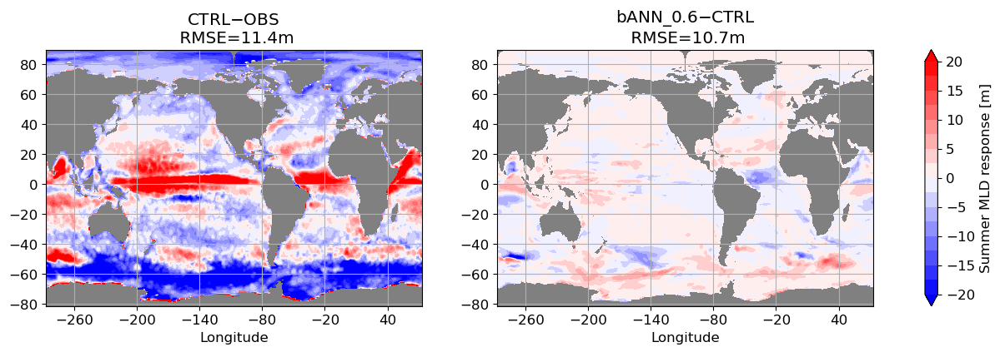

In [105]:
from mom6_tools.m6plot import myStats

%matplotlib inline
plt.figure(figsize=(16,4))

exp = 'coupled_bANN_0.6'
label = 'bANN_0.6'

vmax=20
geolon = exps['CTRL'].grd.geolon
geolat = exps['CTRL'].grd.geolat
area = np.ma.masked_invalid(exps['CTRL'].area) # All computations including area will be masked array from now on
control_summer = exps['CTRL'].mld_summer().MLD_summer
bias = control_summer - obs_summer

plt.subplot(1,2,1)
im = plt.contourf(geolon, geolat, bias, extend='both', levels=np.linspace(-vmax, vmax, 17), cmap='bwr')
_, _, _, _, error = myStats(control_summer - obs_summer, area)
plt.title(f'CTRL$-$OBS \n RMSE={error:.1f}m')
plt.gca().set_facecolor('gray')
plt.xticks(np.arange(-260,60,60))
plt.xlabel('Longitude')
plt.grid()

plt.subplot(1,2,2)
model_summer = exps[exp].mld_summer().MLD_summer
response = model_summer - control_summer
_, _, _, _, error = myStats(model_summer - obs_summer, area)
im = plt.contourf(geolon, geolat, response, extend='both', levels=np.linspace(-vmax, vmax, 17), cmap='bwr')
plt.title(f'{label}$-$CTRL \n RMSE={error:.1f}m')
plt.gca().set_facecolor('gray')
plt.xticks(np.arange(-260,60,60))
plt.xlabel('Longitude')
plt.grid()


plt.colorbar(im,ax=plt.gcf().axes, label='Summer MLD response [m]', extend='both')
plt.savefig(f'PNG_coupled_55years/MLD_summer_response_{exp}.png',dpi=200, bbox_inches='tight')

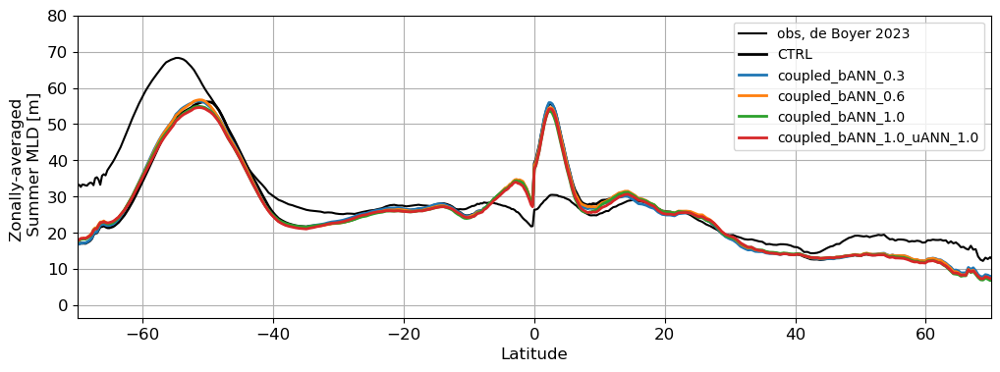

In [106]:
plt.figure(figsize=(12,4))
plt.rcParams.update({'font.size': 12})
zonal_ave(obs_summer, geolat).plot(label='obs, de Boyer 2023', color='k')
model_summer = exps['CTRL'].mld_summer().MLD_summer
zonal_ave(model_summer, geolat).plot(label='CTRL', lw=2, color='k')
model_summer = exps['coupled_bANN_0.3'].mld_summer().MLD_summer
zonal_ave(model_summer, geolat).plot(label='coupled_bANN_0.3', lw=2)
model_summer = exps['coupled_bANN_0.6'].mld_summer().MLD_summer
zonal_ave(model_summer, geolat).plot(label='coupled_bANN_0.6', lw=2)
model_summer = exps['coupled_bANN_1.0'].mld_summer().MLD_summer
zonal_ave(model_summer, geolat).plot(label='coupled_bANN_1.0', lw=2)
model_summer = exps['coupled_bANN_1.0_uANN_1.0'].mld_summer().MLD_summer
zonal_ave(model_summer, geolat).plot(label='coupled_bANN_1.0_uANN_1.0', lw=2)
plt.xlim(-70,70)
plt.legend(fontsize=10)
plt.grid()
plt.yticks(np.arange(0,90,10));
plt.xlabel('Latitude')
plt.ylabel('Zonally-averaged \n Summer MLD [m]')
plt.savefig('PNG_coupled_55years/summer_MLD_zonal.png', dpi=200)

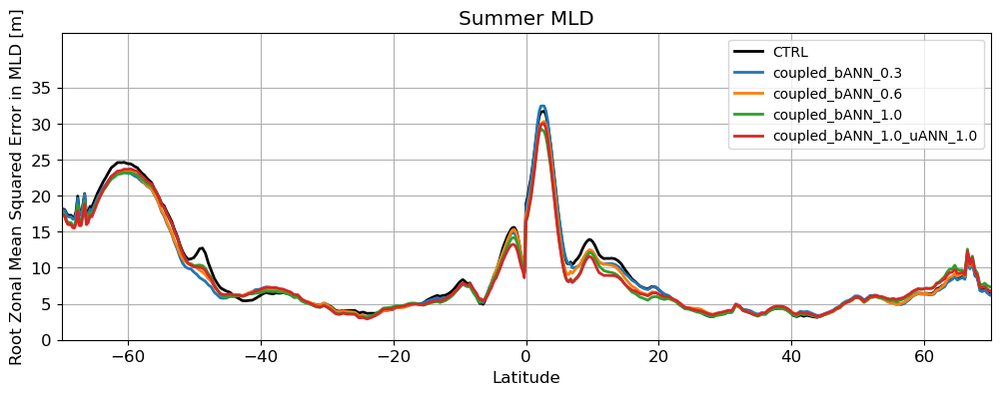

In [107]:
plt.figure(figsize=(12,4))
plt.rcParams.update({'font.size': 12})

model_summer = exps['CTRL'].mld_summer().MLD_summer
np.sqrt(zonal_ave(((model_summer - obs_summer)**2), geolat)).plot(label='CTRL', lw=2, color='k')

model_summer = exps['coupled_bANN_0.3'].mld_summer().MLD_summer
np.sqrt(zonal_ave(((model_summer - obs_summer)**2), geolat)).plot(label='coupled_bANN_0.3', lw=2)

model_summer = exps['coupled_bANN_0.6'].mld_summer().MLD_summer
np.sqrt(zonal_ave(((model_summer - obs_summer)**2), geolat)).plot(label='coupled_bANN_0.6', lw=2)

model_summer = exps['coupled_bANN_1.0'].mld_summer().MLD_summer
np.sqrt(zonal_ave(((model_summer - obs_summer)**2), geolat)).plot(label='coupled_bANN_1.0', lw=2)

model_summer = exps['coupled_bANN_1.0_uANN_1.0'].mld_summer().MLD_summer
np.sqrt(zonal_ave(((model_summer - obs_summer)**2), geolat)).plot(label='coupled_bANN_1.0_uANN_1.0', lw=2)

plt.xlim(-70,70)
plt.legend(fontsize=10)
plt.grid()
plt.yticks(np.arange(0,40,5));
plt.xlabel('Latitude')
plt.title('Summer MLD')
plt.ylabel('Root Zonal Mean Squared Error in MLD [m]')
plt.savefig('PNG_coupled_55years/summer_MLD_zonal_error.png', dpi=200)

# GM overturning

In [110]:
CTRL = xr.open_dataset('ncfiles_coupled_55years/CTRL_MOC_sigma2.nc')
bANN_0p3 = xr.open_dataset('ncfiles_coupled_55years/coupled_bANN_0.3_MOC_sigma2.nc')
bANN_0p6 = xr.open_dataset('ncfiles_coupled_55years/coupled_bANN_0.6_MOC_sigma2.nc')
bANN_1p0 = xr.open_dataset('ncfiles_coupled_55years/coupled_bANN_1.0_MOC_sigma2.nc')
#bANN_1p0_uANN_1p0 = xr.open_dataset('ncfiles_coupled_55years/coupled_bANN_1.0_uANN_1.0_MOC_sigma2.nc')

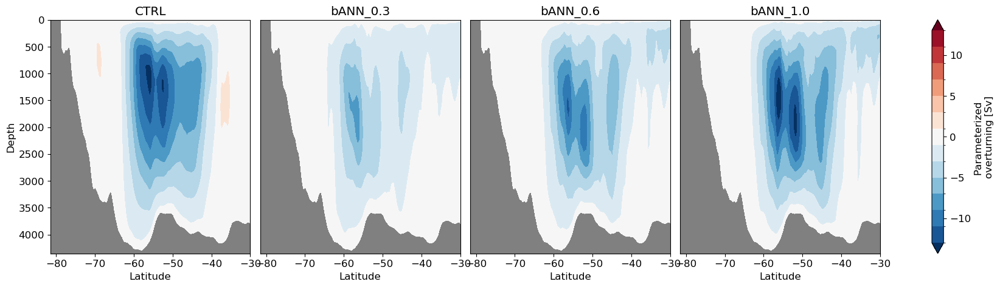

In [111]:
%matplotlib inline

plt.figure(figsize=(22,5))
plt.subplots_adjust(wspace=0.05)

plt.subplot(1,4,1)
CTRL.moc_GM.plot.contourf(x='yq', y='depth', levels=[-13,-11,-9,-7,-5,-3,-1,1,3,5,7,9,11,13], cmap='RdBu_r', extend='both',
                        add_colorbar=False)
plt.gca().invert_yaxis()
plt.title('CTRL')
plt.ylabel('Depth')
plt.xlabel('Latitude')
plt.xlim([None,-30])
plt.gca().set_facecolor('gray')

plt.subplot(1,4,2)
bANN_0p3.moc_GM.plot.contourf(x='yq', y='depth', levels=[-13,-11,-9,-7,-5,-3,-1,1,3,5,7,9,11,13], cmap='RdBu_r', extend='both', add_colorbar=False)
plt.gca().invert_yaxis()
plt.title('bANN_0.3')
plt.ylabel('')
plt.xlabel('Latitude')
plt.xlim([None,-30])
plt.yticks([])
plt.gca().set_facecolor('gray')

plt.subplot(1,4,3)
bANN_0p6.moc_GM.plot.contourf(x='yq', y='depth', levels=[-13,-11,-9,-7,-5,-3,-1,1,3,5,7,9,11,13], cmap='RdBu_r', extend='both', add_colorbar=False)
plt.gca().invert_yaxis()
plt.title('bANN_0.6')
plt.ylabel('')
plt.xlabel('Latitude')
plt.xlim([None,-30])
plt.yticks([])
plt.gca().set_facecolor('gray')


plt.subplot(1,4,4)
im = bANN_1p0.moc_GM.plot.contourf(x='yq', y='depth', levels=[-13,-11,-9,-7,-5,-3,-1,1,3,5,7,9,11,13], cmap='RdBu_r', extend='both', add_colorbar=False)
plt.gca().invert_yaxis()
plt.title('bANN_1.0')
plt.ylabel('')
plt.xlabel('Latitude')
plt.xlim([None,-30])
plt.yticks([])
plt.gca().set_facecolor('gray')

plt.colorbar(im, ax=plt.gcf().axes, label='Parameterized \noverturning [Sv]', extend='both', ticks=np.array([-10,-5,0,5,10]))

#plt.tight_layout()

plt.savefig('PNG_coupled_55years/parameterized_overturning.png', dpi=200, bbox_inches='tight')
plt.show()

# Atmosphere output

In [112]:

#for exp in ['CTRL', 'coupled_bANN_0.3', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0']:
for exp in ['coupled_bANN_0.6']:
    exps[exp].compute_atm()

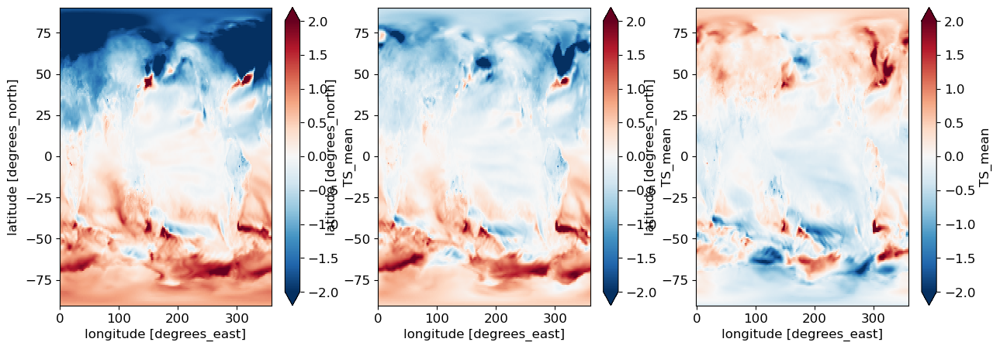

In [113]:
%matplotlib inline
plt.subplot(1,3,1)
(exps['coupled_bANN_1.0'].atm_mean() - exps['CTRL'].atm_mean()).TS_mean.plot(vmin=-2)
plt.subplot(1,3,2)
(exps['coupled_bANN_0.6'].atm_mean() - exps['CTRL'].atm_mean()).TS_mean.plot(vmin=-2)
plt.subplot(1,3,3)
(exps['coupled_bANN_0.3'].atm_mean() - exps['CTRL'].atm_mean()).TS_mean.plot(vmin=-2)

plt.show()

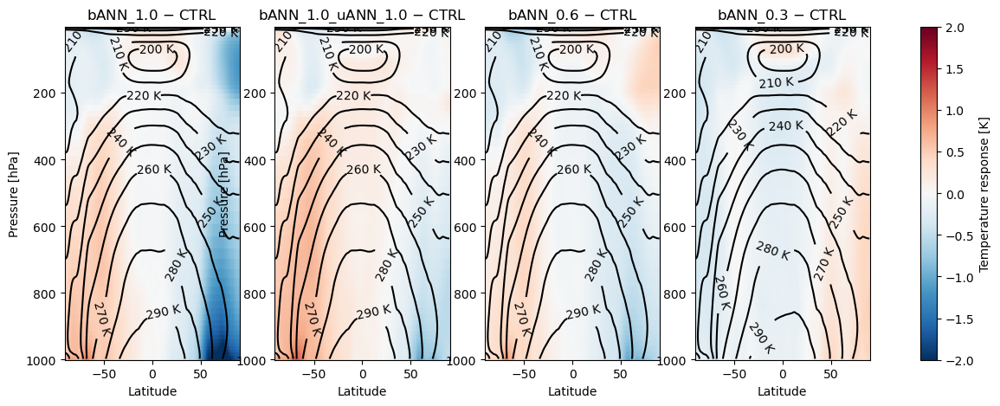

In [117]:
%matplotlib inline
plt.rcParams.update({'font.size': 10})
plt.subplot(1,4,1)
im = (exps['coupled_bANN_1.0'].atm_mean() - exps['CTRL'].atm_mean()).T_mean.plot(vmin=-2, add_colorbar=False)
cb = exps['CTRL'].atm_mean().T_mean.plot.contour(levels=np.arange(200,310,10), colors='k')
plt.clabel(cb, fmt='%1.0f K', fontsize=10)
plt.gca().invert_yaxis()
plt.ylabel('Pressure [hPa]')
plt.xlabel('Latitude')
plt.title('bANN_1.0 $-$ CTRL')

plt.subplot(1,4,2)
im = (exps['coupled_bANN_1.0_uANN_1.0'].atm_mean() - exps['CTRL'].atm_mean()).T_mean.plot(vmin=-2, add_colorbar=False)
cb = exps['CTRL'].atm_mean().T_mean.plot.contour(levels=np.arange(200,310,10), colors='k')
plt.clabel(cb, fmt='%1.0f K', fontsize=10)
plt.gca().invert_yaxis()
plt.ylabel('Pressure [hPa]')
plt.xlabel('Latitude')
plt.title('bANN_1.0_uANN_1.0 $-$ CTRL')


plt.subplot(1,4,3)
im = (exps['coupled_bANN_0.6'].atm_mean() - exps['CTRL'].atm_mean()).T_mean.plot(vmin=-2, add_colorbar=False)
cb = exps['CTRL'].atm_mean().T_mean.plot.contour(levels=np.arange(200,310,10), colors='k')
plt.clabel(cb, fmt='%1.0f K', fontsize=10)
plt.gca().invert_yaxis()
plt.ylabel('Pressure [hPa]')
plt.xlabel('Latitude')
plt.title('bANN_0.6 $-$ CTRL')
plt.ylabel('')

plt.subplot(1,4,4)
im = (exps['coupled_bANN_0.3'].atm_mean() - exps['CTRL'].atm_mean()).T_mean.plot(vmin=-2, add_colorbar=False)
plt.colorbar(im, label='Temperature response [K]', ax=plt.gcf().axes)
cb = exps['CTRL'].atm_mean().T_mean.plot.contour(levels=np.arange(200,310,10), colors='k')
plt.clabel(cb, fmt='%1.0f K', fontsize=10)
plt.gca().invert_yaxis()
plt.ylabel('Pressure [hPa]')
plt.xlabel('Latitude')
plt.title('bANN_0.3 $-$ CTRL')
plt.ylabel('')


plt.savefig('PNG_coupled_55years/atm_response.png', dpi=200, bbox_inches='tight')
plt.show()

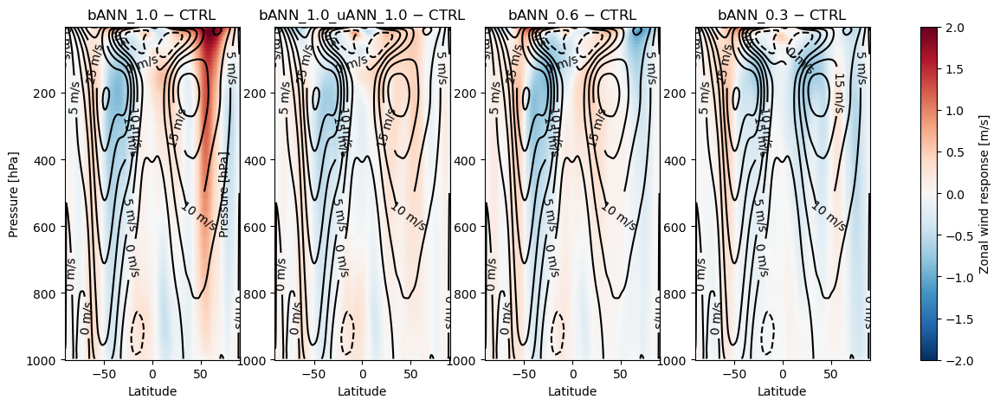

In [119]:
%matplotlib inline
plt.rcParams.update({'font.size': 10})
plt.subplot(1,4,1)
im = (exps['coupled_bANN_1.0'].atm_mean() - exps['CTRL'].atm_mean()).U_mean.plot(vmin=-2, add_colorbar=False)
cb = exps['CTRL'].atm_mean().U_mean.plot.contour(levels=np.arange(-100,110,5), colors='k')
plt.clabel(cb, fmt='%1.0f m/s', fontsize=10)
plt.gca().invert_yaxis()
plt.ylabel('Pressure [hPa]')
plt.xlabel('Latitude')
plt.title('bANN_1.0 $-$ CTRL')

plt.subplot(1,4,2)
im = (exps['coupled_bANN_1.0_uANN_1.0'].atm_mean() - exps['CTRL'].atm_mean()).U_mean.plot(vmin=-2, add_colorbar=False)
cb = exps['CTRL'].atm_mean().U_mean.plot.contour(levels=np.arange(-100,110,5), colors='k')
plt.clabel(cb, fmt='%1.0f m/s', fontsize=10)
plt.gca().invert_yaxis()
plt.ylabel('Pressure [hPa]')
plt.xlabel('Latitude')
plt.title('bANN_1.0_uANN_1.0 $-$ CTRL')

plt.subplot(1,4,3)
im = (exps['coupled_bANN_0.6'].atm_mean() - exps['CTRL'].atm_mean()).U_mean.plot(vmin=-2, add_colorbar=False)
cb = exps['CTRL'].atm_mean().U_mean.plot.contour(levels=np.arange(-100,110,5), colors='k')
plt.clabel(cb, fmt='%1.0f m/s', fontsize=10)
plt.gca().invert_yaxis()
plt.ylabel('Pressure [hPa]')
plt.xlabel('Latitude')
plt.title('bANN_0.6 $-$ CTRL')
plt.ylabel('')

plt.subplot(1,4,4)
im = (exps['coupled_bANN_0.3'].atm_mean() - exps['CTRL'].atm_mean()).U_mean.plot(vmin=-2, add_colorbar=False)
plt.colorbar(im, label='Zonal wind response [m/s]', ax=plt.gcf().axes)
cb = exps['CTRL'].atm_mean().U_mean.plot.contour(levels=np.arange(-100,110,5), colors='k')
plt.clabel(cb, fmt='%1.0f m/s', fontsize=10)
plt.gca().invert_yaxis()
plt.ylabel('Pressure [hPa]')
plt.xlabel('Latitude')
plt.title('bANN_0.3 $-$ CTRL')
plt.ylabel('')

plt.savefig('PNG_coupled_55years/atm_U_response.png', dpi=200, bbox_inches='tight')
plt.show()

# Check MEKE diagnostics

In [ ]:
ds_0p3 = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_0.3/ocn/hist/coupled_bANN_0.3.mom6.h.native.*.nc')

In [ ]:
ds_0p6 = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_0.6/ocn/hist/coupled_bANN_0.6.mom6.h.native.*.nc')

In [ ]:
ds_1p0 = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_1.0/ocn/hist/coupled_bANN_1.0.mom6.h.native.*.nc')

In [ ]:
MEKE_0p3 = ds_0p3.sel(time=slice('0031','0054')).MEKE.mean('time').compute()

In [ ]:
MEKE_0p6 = ds_0p6.sel(time=slice('0031','0054')).MEKE.mean('time').compute()

In [ ]:
MEKE_1p0 = ds_1p0.sel(time=slice('0031','0054')).MEKE.mean('time').compute()

In [ ]:
MEKE_GM_src_0p3 = ds_0p3.sel(time=slice('0031','0054')).MEKE_GM_src.mean('time').compute()

In [ ]:
MEKE_GM_src_0p6 = ds_0p6.sel(time=slice('0031','0054')).MEKE_GM_src.mean('time').compute()

In [ ]:
MEKE_GM_src_1p0 = ds_1p0.sel(time=slice('0031','0054')).MEKE_GM_src.mean('time').compute()

In [ ]:
ds_0p3z = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_0.3/ocn/hist/coupled_bANN_0.3.mom6.h.z.*.nc')

In [ ]:
ds_0p6z = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_0.6/ocn/hist/coupled_bANN_0.6.mom6.h.z.*.nc')

In [ ]:
ds_1p0z = xr.open_mfdataset('/glade/derecho/scratch/pavelp/archive/coupled_bANN_1.0/ocn/hist/coupled_bANN_1.0.mom6.h.z.*.nc')

In [ ]:
FrictWork_0p3 = ds_0p3z.sel(time=slice('0031','0054')).FrictWork.mean('time').compute()

In [ ]:
FrictWork_0p6 = ds_0p6z.sel(time=slice('0031','0054')).FrictWork.mean('time').compute()

In [ ]:
FrictWork_1p0 = ds_1p0z.sel(time=slice('0031','0054')).FrictWork.mean('time').compute()

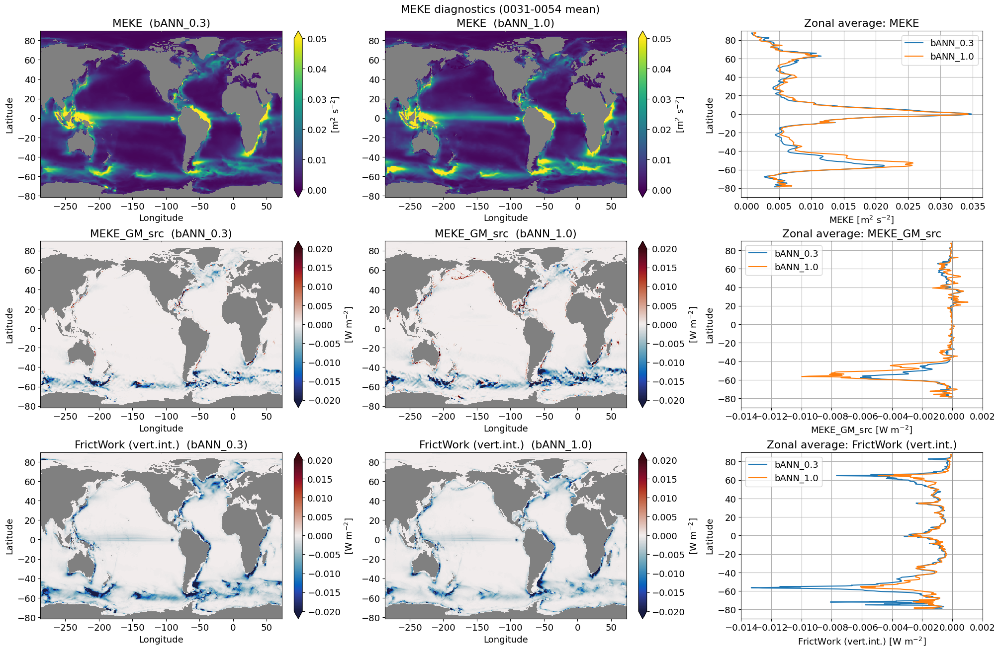

In [ ]:
%matplotlib inline
import cmocean
plt.rcParams.update({'font.size': 13})

geolon = exps['CTRL'].grd.geolon
geolat = exps['CTRL'].grd.geolat

# FrictWork is per-layer work in W m-2; vertically integrate to a column total.
# min_count=1 keeps all-NaN (land) columns as NaN so they render as land, not 0.
FrictWork_0p3_2d = FrictWork_0p3.sum('z_l', min_count=1)
FrictWork_0p6_2d = FrictWork_0p6.sum('z_l', min_count=1)
FrictWork_1p0_2d = FrictWork_1p0.sum('z_l', min_count=1)

def za_line(a):
    """Zonally-averaged 1D profile (value, latitude) from a 2D field."""
    z = zonal_ave(a, geolat)
    lat = np.array([iv.mid for iv in z.geolat_bins.values])
    return z.values, lat

# Experiments to plot as map columns: (tag, MEKE, MEKE_GM_src, FrictWork_2d)
experiments_meke = [
    ('bANN_0.3', MEKE_0p3, MEKE_GM_src_0p3, FrictWork_0p3_2d),
    ('bANN_0.6', MEKE_0p6, MEKE_GM_src_0p6, FrictWork_0p6_2d),
    ('bANN_1.0', MEKE_1p0, MEKE_GM_src_1p0, FrictWork_1p0_2d),
]
tags = [e[0] for e in experiments_meke]

# name, field index in experiments_meke tuple, units, cmap, (vmin, vmax) or None
quantities = [
    ('MEKE',                  1, r'm$^2$ s$^{-2}$', 'viridis',            (0, 0.05)),
    ('MEKE_GM_src',           2, r'W m$^{-2}$',     cmocean.cm.balance,   (-0.02, 0.02)),
    ('FrictWork (vert.int.)', 3, r'W m$^{-2}$',     cmocean.cm.balance,   (-0.02, 0.02)),
]

n_exp = len(experiments_meke)
n_col = n_exp + 1  # map per experiment + one zonal-average column
fig, axes = plt.subplots(3, n_col, figsize=(6.5 * n_col, 13), layout='constrained')

for i, (name, fidx, units, cmap, vlim) in enumerate(quantities):
    fields = [e[fidx] for e in experiments_meke]
    is_div = cmap != 'viridis'
    if vlim is not None:
        vmin, vmax = vlim
    else:
        both = np.concatenate([np.asarray(f).ravel() for f in fields])
        both = both[np.isfinite(both)]
        if is_div:
            vmax = np.nanpercentile(np.abs(both), 99)
            vmin = -vmax
        else:
            vmin, vmax = 0, np.nanpercentile(both, 99)

    # 2D maps for each experiment
    for j, (tag, f) in enumerate(zip(tags, fields)):
        ax = axes[i, j]
        ax.set_facecolor('gray')  # gray land shading (NaN cells)
        pm = ax.pcolormesh(geolon, geolat, f, cmap=cmap, vmin=vmin, vmax=vmax, shading='auto')
        fig.colorbar(pm, ax=ax, label=f'[{units}]', extend='both')
        ax.set_title(f'{name}  ({tag})')
        ax.set_xlabel('Longitude')
        if j == 0:
            ax.set_ylabel('Latitude')

    # Zonally-averaged profile
    ax = axes[i, n_col - 1]
    for tag, f in zip(tags, fields):
        v, lat = za_line(f)
        ax.plot(v, lat, label=tag)
    if is_div:
        ax.axvline(0, color='0.6', lw=0.8)
        ax.set_xlim([-0.014, 0.002])
    ax.set_xlabel(f'{name} [{units}]')
    ax.set_ylabel('Latitude')
    ax.set_ylim([-90, 90])
    ax.set_title(f'Zonal average: {name}')
    ax.grid(True)
    ax.legend()

fig.suptitle('MEKE diagnostics (0031-0054 mean)')
plt.savefig('PNG_coupled_55years/MEKE_diagnostics_maps_3exp.png', dpi=200, bbox_inches='tight')
plt.show()


# Optimal tuning coefficient

In [7]:
import intake
catalog = intake.open_catalog('/glade/u/home/gmarques/libs/oce-catalogs/reference-datasets.yml')
rapid = catalog['moc-rapid'].to_dask()

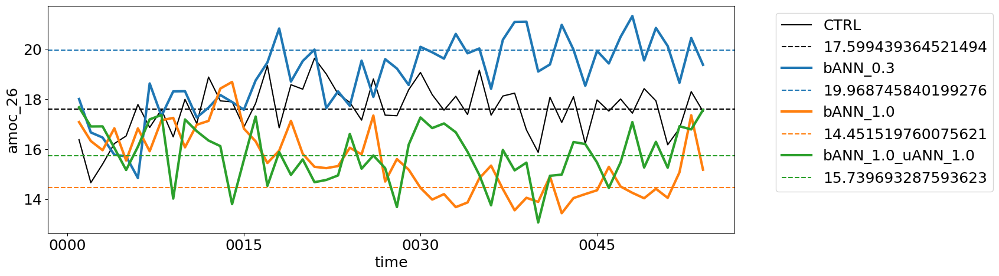

In [45]:
%matplotlib inline
data = xr.open_dataset(f'ncfiles_coupled_55years/CTRL_MOC.nc').amoc_26[:54]
data.plot(color='k', label='CTRL')
value = float(data[-24:].mean())
plt.axhline(y=value, color='k', ls='--', label=value)

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_0.3_MOC.nc').amoc_26[:54]
data.plot(color='tab:blue', label='bANN_0.3', lw=3)
value = float(data[-24:].mean())
plt.axhline(y=value, color='tab:blue', ls='--', label=value)

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_1.0_MOC.nc').amoc_26[:54]
data.plot(color='tab:orange', label='bANN_1.0', lw=3)
value = float(data[-24:].mean())
plt.axhline(y=value, color='tab:orange', ls='--', label=value)

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_1.0_uANN_1.0_MOC.nc').amoc_26[:54]
data.plot(color='tab:green', label='bANN_1.0_uANN_1.0', lw=3)
value = float(data[-24:].mean())
plt.axhline(y=value, color='tab:green', ls='--', label=value)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Optimal coefficient for Dhruv alone


In [40]:
# Green function approach (Menemenlis et al.) to estimate the optimal
# parameterization coefficient assuming a linear response of AMOC.
#
# Two sensitivity experiments give two (coefficient, AMOC) points; the
# Green function (sensitivity) is the slope dAMOC/dcoeff. We then solve
# for the coefficient that reproduces the control (target) AMOC.

amoc_target = 17.5994   # Control AMOC we want to match

c1, amoc1 = 0.3, 19.9687  # tuned-down parameterization
c2, amoc2 = 1.0, 14.4515  # full-strength parameterization

# Green function (sensitivity of AMOC to the coefficient)
G = (amoc2 - amoc1) / (c2 - c1)
print(f"Green function dAMOC/dcoeff = {G:.4f} Sv per unit coefficient")

# Linear interpolation: AMOC(c) = amoc1 + G * (c - c1)
# Solve AMOC(c_opt) = amoc_target  ->  c_opt = c1 + (amoc_target - amoc1) / G
c_opt = c1 + (amoc_target - amoc1) / G
print(f"Optimal coefficient = {c_opt:.4f}")


Green function dAMOC/dcoeff = -7.8817 Sv per unit coefficient
Optimal coefficient = 0.6006


In [43]:
# Alternative reference numbers
print(xr.open_dataset(f'ncfiles_coupled_55years/CTRL_MOC.nc').amoc.sel(yq=26, method='nearest').max().item())
print(xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_0.3_MOC.nc').amoc.sel(yq=26, method='nearest').max().item())
print(xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_1.0_MOC.nc').amoc.sel(yq=26, method='nearest').max().item())

17.406795019541413
19.77425253693261
14.680633438832135


In [44]:
# Alternative reference numbers

# Green function approach (Menemenlis et al.) to estimate the optimal
# parameterization coefficient assuming a linear response of AMOC.
#
# Two sensitivity experiments give two (coefficient, AMOC) points; the
# Green function (sensitivity) is the slope dAMOC/dcoeff. We then solve
# for the coefficient that reproduces the control (target) AMOC.

amoc_target = 17.406795019541413   # Control AMOC we want to match

c1, amoc1 = 0.3, 19.77425253693261  # tuned-down parameterization
c2, amoc2 = 1.0, 14.680633438832135  # full-strength parameterization

# Green function (sensitivity of AMOC to the coefficient)
G = (amoc2 - amoc1) / (c2 - c1)
print(f"Green function dAMOC/dcoeff = {G:.4f} Sv per unit coefficient")

# Linear interpolation: AMOC(c) = amoc1 + G * (c - c1)
# Solve AMOC(c_opt) = amoc_target  ->  c_opt = c1 + (amoc_target - amoc1) / G
c_opt = c1 + (amoc_target - amoc1) / G
print(f"Optimal coefficient = {c_opt:.4f}")


Green function dAMOC/dcoeff = -7.2766 Sv per unit coefficient
Optimal coefficient = 0.6254


# Optimal coefficient for bANN+uANN

In [46]:
# Green function approach (Menemenlis et al.) to estimate the optimal
# parameterization coefficient assuming a linear response of AMOC.
#
# Two sensitivity experiments give two (coefficient, AMOC) points; the
# Green function (sensitivity) is the slope dAMOC/dcoeff. We then solve
# for the coefficient that reproduces the control (target) AMOC.

amoc_target = 17.5994   # Control AMOC we want to match

c1, amoc1 = 0.3, 19.9687  # tuned-down parameterization
c2, amoc2 = 1.0, 14.4515  # full-strength parameterization
amoc3 = 15.7396

# Green function (sensitivity of AMOC to the coefficient)
G = (amoc2 - amoc1) / (c2 - c1)
print(f"Green function dAMOC/dcoeff = {G:.4f} Sv per unit coefficient")

# Linear interpolation: AMOC(c) = amoc3 + G * (c - c2)
# Solve AMOC(c_opt) = amoc_target  ->  c_opt = c2 + (amoc_target - amoc3) / G
c_opt = c2 + (amoc_target - amoc3) / G
print(f"Optimal coefficient = {c_opt:.4f}")


Green function dAMOC/dcoeff = -7.8817 Sv per unit coefficient
Optimal coefficient = 0.7640


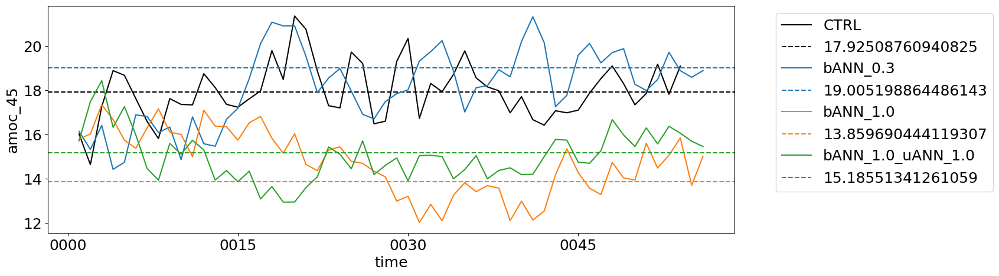

In [32]:
%matplotlib inline
data = xr.open_dataset(f'ncfiles_coupled_55years/CTRL_MOC.nc').amoc_45
data.plot(color='k', label='CTRL')
value = float(data[-24:].mean())
plt.axhline(y=value, color='k', ls='--', label=value)

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_0.3_MOC.nc').amoc_45
data.plot(color='tab:blue', label='bANN_0.3')
value = float(data[-24:].mean())
plt.axhline(y=value, color='tab:blue', ls='--', label=value)

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_1.0_MOC.nc').amoc_45
data.plot(color='tab:orange', label='bANN_1.0')
value = float(data[-24:].mean())
plt.axhline(y=value, color='tab:orange', ls='--', label=value)

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_1.0_uANN_1.0_MOC.nc').amoc_45
data.plot(color='tab:green', label='bANN_1.0_uANN_1.0')
value = float(data[-24:].mean())
plt.axhline(y=value, color='tab:green', ls='--', label=value)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

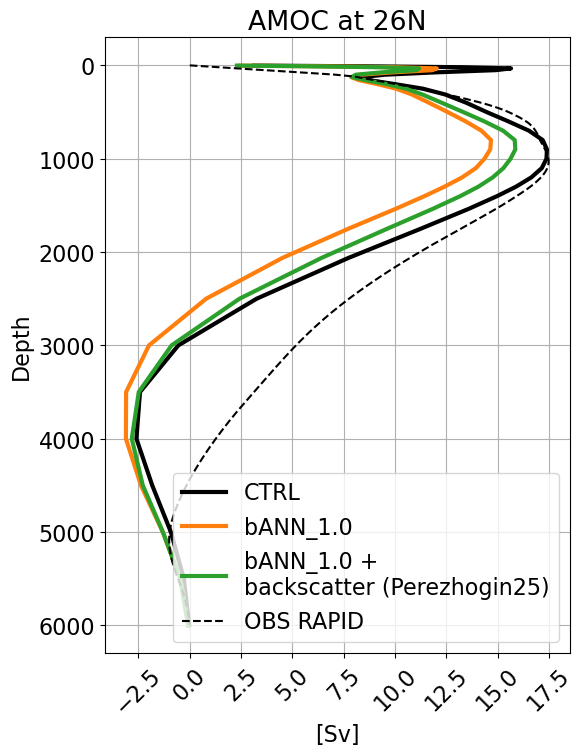

In [ ]:
plt.rcParams.update({'font.size': 16})
plt.figure(figsize=(6,8))
for exp, label, color in zip(['CTRL', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0'],
                      ['CTRL', 'bANN_1.0', 'bANN_1.0 + \nbackscatter (Perezhogin25)'],
                      ['k', 'tab:orange', 'tab:green']):
    xr.open_dataset(f'ncfiles_coupled_55years/{exp}_MOC.nc').amoc.sel(yq=26,method='nearest').plot(label=label, y='zl', lw=3, color=color)
rapid.stream_function_mar.mean('time').plot(color='k', label='OBS RAPID', y='depth', ls='--')
plt.gca().invert_yaxis()
plt.xticks(np.arange(-2.5,20,2.5), rotation=45)
plt.grid()
plt.legend()
plt.title('AMOC at 26N')
plt.ylabel('Depth')
plt.xlabel('[Sv]')

plt.savefig('PNG_coupled_55years/AMOC_RAPID_backscatter.png', dpi=200, bbox_inches='tight')

# Test new scaling

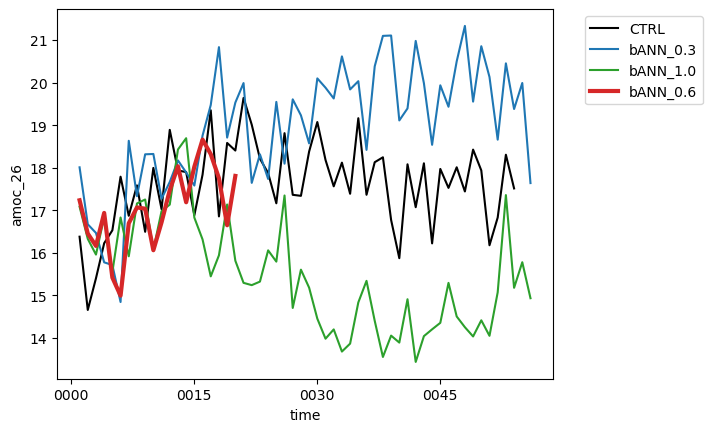

In [ ]:
%matplotlib inline
data = xr.open_dataset(f'ncfiles_coupled_55years/CTRL_MOC.nc').amoc_26
data.plot(color='k', label='CTRL')

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_0.3_MOC.nc').amoc_26
data.plot(color='tab:blue', label='bANN_0.3')

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_1.0_MOC.nc').amoc_26
data.plot(color='tab:green', label='bANN_1.0')

data = xr.open_dataset(f'ncfiles/coupled_bANN_0.6_MOC.nc').amoc_26
data.plot(color='tab:red', label='bANN_0.6', lw=3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

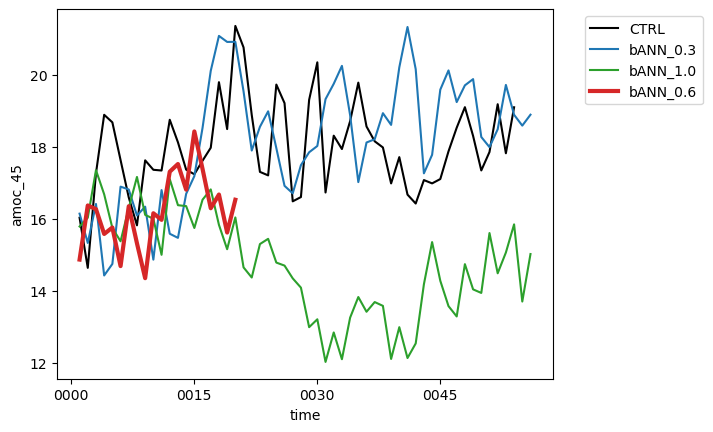

In [ ]:
%matplotlib inline
data = xr.open_dataset(f'ncfiles_coupled_55years/CTRL_MOC.nc').amoc_45
data.plot(color='k', label='CTRL')

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_0.3_MOC.nc').amoc_45
data.plot(color='tab:blue', label='bANN_0.3')

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_1.0_MOC.nc').amoc_45
data.plot(color='tab:green', label='bANN_1.0')

data = xr.open_dataset(f'ncfiles/coupled_bANN_0.6_MOC.nc').amoc_45
data.plot(color='tab:red', label='bANN_0.6', lw=3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

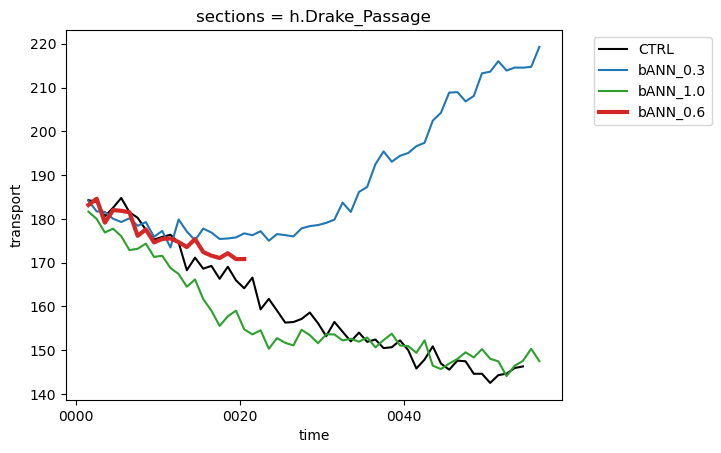

In [ ]:
%matplotlib inline
data = xr.open_dataset(f'ncfiles_coupled_55years/CTRL_section_transports.nc').transport.isel(sections=5).coarsen({'time':12}).mean()
data.plot(color='k', label='CTRL')

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_0.3_section_transports.nc').transport.isel(sections=5).coarsen({'time':12}).mean()
data.plot(color='tab:blue', label='bANN_0.3')

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_1.0_section_transports.nc').transport.isel(sections=5).coarsen({'time':12}).mean()
data.plot(color='tab:green', label='bANN_1.0')

data = xr.open_dataset(f'ncfiles/coupled_bANN_0.6_section_transports.nc').transport.isel(sections=5).coarsen({'time':12}).mean()
data.plot(color='tab:red', label='bANN_0.6', lw=3)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


# Neutral and slopes formulatrions

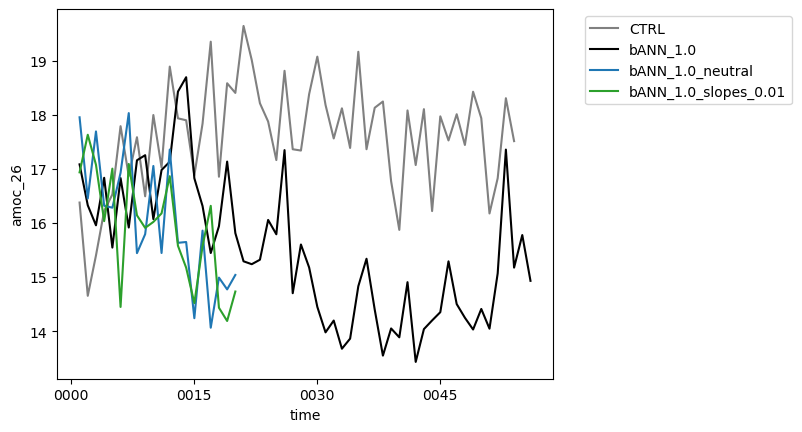

In [16]:
%matplotlib inline

data = xr.open_dataset(f'ncfiles_coupled_55years/CTRL_MOC.nc').amoc_26
data.plot(color='gray', label='CTRL')

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_1.0_MOC.nc').amoc_26
data.plot(color='k', label='bANN_1.0')

data = xr.open_dataset(f'ncfiles/coupled_bANN_1.0_neutral_MOC.nc').amoc_26
data.plot(color='tab:blue', label='bANN_1.0_neutral')

data = xr.open_dataset(f'ncfiles/coupled_bANN_1.0_slopes_0.01_MOC.nc').amoc_26
data.plot(color='tab:green', label='bANN_1.0_slopes_0.01')


plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

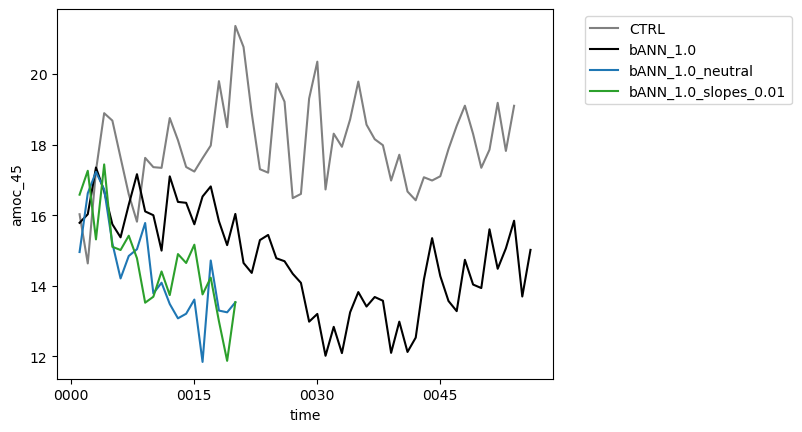

In [15]:
%matplotlib inline

data = xr.open_dataset(f'ncfiles_coupled_55years/CTRL_MOC.nc').amoc_45
data.plot(color='gray', label='CTRL')

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_1.0_MOC.nc').amoc_45
data.plot(color='k', label='bANN_1.0')

data = xr.open_dataset(f'ncfiles/coupled_bANN_1.0_neutral_MOC.nc').amoc_45
data.plot(color='tab:blue', label='bANN_1.0_neutral')

data = xr.open_dataset(f'ncfiles/coupled_bANN_1.0_slopes_0.01_MOC.nc').amoc_45
data.plot(color='tab:green', label='bANN_1.0_slopes_0.01')


plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

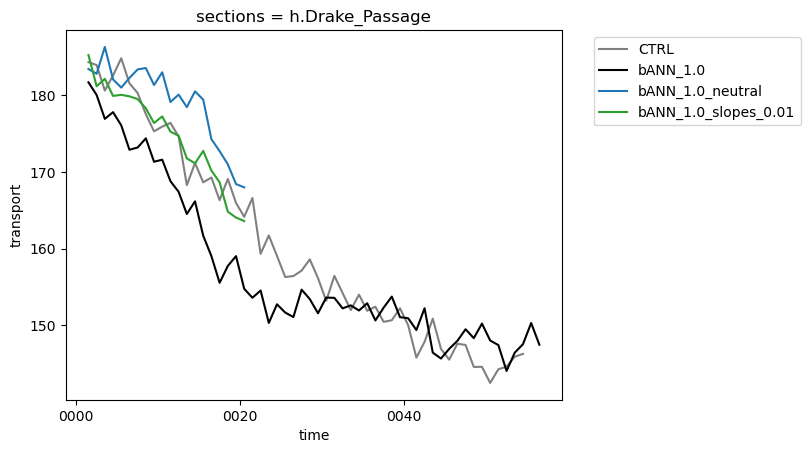

In [17]:
%matplotlib inline

data = xr.open_dataset(f'ncfiles_coupled_55years/CTRL_section_transports.nc').transport.isel(sections=5).coarsen({'time':12}).mean()
data.plot(color='gray', label='CTRL')

data = xr.open_dataset(f'ncfiles_coupled_55years/coupled_bANN_1.0_section_transports.nc').transport.isel(sections=5).coarsen({'time':12}).mean()
data.plot(color='k', label='bANN_1.0')

data = xr.open_dataset(f'ncfiles/coupled_bANN_1.0_neutral_section_transports.nc').transport.isel(sections=5).coarsen({'time':12}).mean()
data.plot(color='tab:blue', label='bANN_1.0_neutral')

data = xr.open_dataset(f'ncfiles/coupled_bANN_1.0_slopes_0.01_section_transports.nc').transport.isel(sections=5).coarsen({'time':12}).mean()
data.plot(color='tab:green', label='bANN_1.0_slopes_0.01')

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()
